# ECCV 2020 - Feature representations, then and now

Authors: 

* Afraz Salim
* Martin Rýpar
* Philippe Dewart
* Tim Bottelbergs



Welcome to our tutorial about using feature representations. We will guide you through a set of commonly used feature representations and demonstrate some specific characteristics of them on the VGG Faces dataset, which is a dataset of celibraties commonly used to demonstrate computer vision algorithms.

We will start of by importing some important Python libraries, that we will need later on.

In [1]:
# IMPORT LIBRARIES
import os
import sys
import cv2
import tarfile
import numpy as np
from google.colab import drive
import pandas as pd
import copy

# Used for downloading the images
from urllib import request
from urllib.error import URLError, HTTPError
from http.client import RemoteDisconnected

# Imports used for hog features
from skimage.feature import hog

# Imports used for displaying images and graphs
from google.colab.patches import cv2_imshow
from skimage import data, exposure
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

%matplotlib inline
%tensorflow_version 1.x


# Global variables
FACE_HEIGHT = FACE_WIDTH = 200

TensorFlow 1.x selected.


As in all good computer vision experiments, we need to gather our dataset first. The VGG Faces dataset is freely available in a .tar.gz file. So we will first download and unpack it.

In [0]:
base_path = "/content/sample_data/CV__Group_assignment"

if not os.path.isdir(base_path):
  os.makedirs(base_path)

  vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

  with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
      f.write(r.read())

  with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
      f.extractall(os.path.join(base_path))

Before we start downloading all our images, we will contruct a preprocessing pipeline that we will apply to every image:
* Convert the image to grayscale. We don't expect the color to bring much value in most of the features extractors.
* Extract the face of the image: we are only interested in building features for the face. The images in the dataset will contain a bigger part of the scene, so we need to crop it. 
* Resize every image to the same width and height. We will resize our images to a width of 200 and a height of 200 (since a face tends to have a square shape) 

We will use a Haar cascade classifier (as was proposed by Paul Viola and Michael Jones) to detect the face. A pretrained classifier can be freely downloaded.

In [0]:
trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
  f.write(r.read())

faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

In [0]:
# Returns the face contours of exactly 1 face that was detected in the image. If no face is detected, an error will occur. 
def extract_face_contour(img):
  faces = faceCascade.detectMultiScale(
      img,
      scaleFactor=1.2,
      minNeighbors=5,
      minSize=(30, 30),
      flags=cv2.CASCADE_SCALE_IMAGE
  )
  return faces[0]

# the preprocessing pipeline that will be applied to every image
def convert_image(nimg):  

  # Convert to grayscale
  nimg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Extract the face in the image
  face = extract_face_contour(nimg)
  nimg =  nimg[face[1]:face[1]+face[2],face[0]:face[0]+face[3]]
  
  # Resize the image to 200 by 200 pixels
  nimg = cv2.resize(nimg, (FACE_HEIGHT,FACE_WIDTH), interpolation = cv2.INTER_AREA)
  return nimg

We will be using a dataset consisting of four celebrities:
* Person A (Adam Levine)
* Person B (Doutzen Kroes)
* Person C (Casey Affleck)
* Person D (Elle Macpherson)

Choosing these celebrities has a specific purpose: we require a good match between person A and C and between B and D. You can see further on that A and C are both male with short hair. B and D are both female with long blond hair. We expect that our feature representations will be influenced by these features and thus will be able to better distinguish A and B then for example A and C.

For A and B we are gathering 20 training images each. For all 4 we will gather 10 testing images.

In the VGG faces dataset, a .txt file is present for each celebrity, containing a space-separated dataset with a unique id, a picture url and the bounding box of the detected face.

We filter this dataset based on the 'pose' of the detected face, using only frontal face poses. This will help us further on in evaluating our feature extraction algorithms. 

For each image, we apply our preprocessing pipeline (we will use the Haar classifier for detecting the face instead of the bounding box that is in the dataset).

The output displays the number of found pictures for our dataset during the search, since this can take a while.

In [5]:
face_dir = os.path.join(base_path, "vgg_face_dataset", "files")
# The different subjects we will use
face_files = ['Adam_Levine.txt', 'Doutzen_Kroes.txt', 'Casey_Affleck.txt', 'Elle_Macpherson.txt']

# The column names of that are used in the dataset
col_names = ['id', 'url', 'left', 'top', 'right', 'bottom', 'pose', 'detection_score', 'curation']
train_images, test_images, train_images_org, test_images_org = [], [], [], []

for face_idx, face_file in enumerate(face_files):
  print("")
  print("Checking {}".format(face_file))
  # Read the dataset file for the current subject
  faces = pd.read_csv(os.path.join(face_dir, face_file), sep=' ', header = None, names = col_names)

  # Only use frontal faces
  selected_faces = faces[faces.pose > 2]
  if face_idx == 0:
    # Correction made for the first subject to skip an incorrect image
    selected_faces = faces[(faces.pose > 2) & (faces.id != 7)]

  train_images_, test_images_, train_images_org_, test_images_org_ = [], [], [], []
  for idx, selected_face in selected_faces.iterrows():

    try:
      res = request.urlopen(selected_face['url'], timeout = 5)
      img = np.asarray(bytearray(res.read()), dtype="uint8")
      img = cv2.imdecode(img, cv2.IMREAD_COLOR)
      
      if img is not None:
        if face_idx in [0,1] and len(train_images_) < 20:
            train_images_.append(convert_image(img))
            train_images_org_.append(img)
        else:
            test_images_.append(convert_image(img))
            test_images_org_.append(img)

        print("{} (id: {})...".format(str(len(train_images_) + len(test_images_)), selected_face['id'],), end='')
    except (HTTPError, URLError, RemoteDisconnected):
      pass  # If the images is not accessible anymore, simply move on
    except:
      print("Error:", sys.exc_info())
    
    if len(train_images_) + len(test_images_) == 30:
      train_images.append(train_images_)
      test_images.append(test_images_)
      train_images_org.append(train_images_org_)
      test_images_org.append(test_images_org_)
      break
    
    if face_idx not in [0,1] and len(test_images_) == 10:
      test_images.append(test_images_)
      test_images_org.append(test_images_org_)
      break

train_im_class = train_images
test_im_class = test_images


Checking Adam_Levine.txt
1 (id: 2)...2 (id: 4)...3 (id: 5)...4 (id: 6)...5 (id: 8)...6 (id: 10)...7 (id: 13)...8 (id: 14)...9 (id: 17)...10 (id: 20)...11 (id: 21)...12 (id: 22)...13 (id: 25)...14 (id: 27)...15 (id: 28)...16 (id: 31)...17 (id: 32)...18 (id: 33)...19 (id: 34)...20 (id: 39)...21 (id: 42)...22 (id: 43)...23 (id: 45)...24 (id: 46)...25 (id: 47)...26 (id: 48)...27 (id: 51)...28 (id: 52)...29 (id: 55)...30 (id: 56)...
Checking Doutzen_Kroes.txt
1 (id: 6)...2 (id: 7)...3 (id: 10)...4 (id: 14)...5 (id: 17)...6 (id: 19)...7 (id: 24)...8 (id: 25)...9 (id: 30)...10 (id: 31)...11 (id: 32)...12 (id: 34)...13 (id: 35)...14 (id: 36)...15 (id: 40)...16 (id: 45)...Error: (<class 'IndexError'>, IndexError('tuple index out of range',), <traceback object at 0x7f06c3739e88>)
17 (id: 47)...18 (id: 50)...19 (id: 54)...20 (id: 55)...21 (id: 57)...22 (id: 63)...23 (id: 67)...Error: (<class 'IndexError'>, IndexError('tuple index out of range',), <traceback object at 0x7f06c373bf08>)
Error: (<cl

Eventually, we are getting a set of training images (in 'train_images') and a set of test images (in 'test_images'). It is always a good idea to explore the dimensions of our data. As seen in the following code block we have 2 sets of training images (one for subject A and one for subject B). Each set contains 20 images. We further have 4 sets of test images (for each subject), containing each 10 images.
We display the dimensions of the first image of the first image set for both training and test - all images should have the same dimensions because of our preprocessing pipeline.

In [6]:
print("Number of training image sets:", len(train_images))
print("Number of images in the first training image set:", len(train_images[0]))
print("Dimensions of the first image in the first training image set:", train_images[0][0].shape)
print("Number of test image sets:", len(test_images))
print("Number of images in the first test image set:", len(test_images[0]))
print("Dimensions of the first image in the first test image set:", test_images[0][0].shape)

Number of training image sets: 2
Number of images in the first training image set: 20
Dimensions of the first image in the first training image set: (200, 200)
Number of test image sets: 4
Number of images in the first test image set: 10
Dimensions of the first image in the first test image set: (200, 200)


After this, let's have a look at our images! We use the pyplot library to display two subplots. One for the training images and one for the test images.

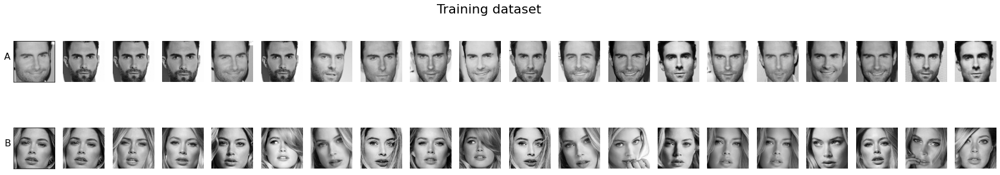

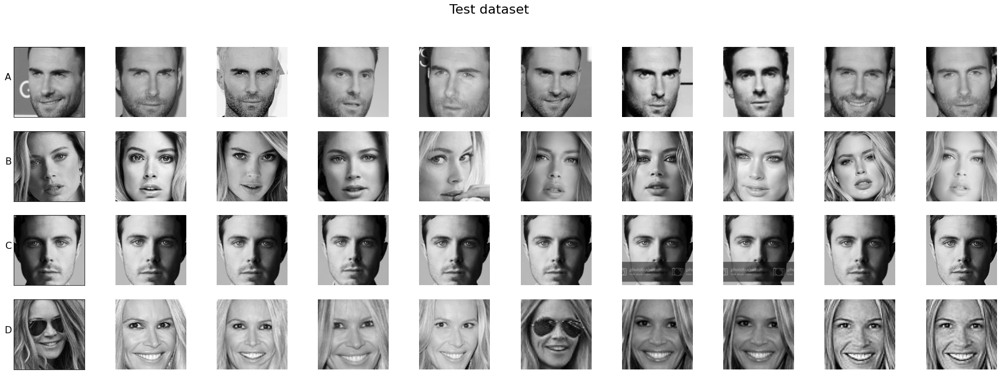

In [7]:
# convenience method to display a y label, without displaying the x axis or y ticks (used for the first picture in each row)
def set_ylabel(ax, text):
  ax.set_axis_on()
  ax.get_xaxis().set_visible(False)
  ax.set_yticks([])
  ax.set_ylabel(text, fontsize=16, rotation=0, labelpad=10)

# construct the subplots for the training dataset
fig, ax = plt.subplots(2, 20, frameon=False)
fig.suptitle("Training dataset", fontsize=22)
fig.set_size_inches(30, 5)

# for subject A and B we will display the different pictures in 2 rows
for i_subject in range(0,2):
  for i_img, img in enumerate(train_images[i_subject]):
    ax[i_subject, i_img].set_axis_off()
    ax[i_subject, i_img].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
# setting the y labels for the first picture in each row    
set_ylabel(ax[0, 0], 'A')
set_ylabel(ax[1, 0], 'B')

# construct the subplots for the test dataset
fig, ax = plt.subplots(4, 10)
fig.suptitle("Test dataset", fontsize=22)
fig.set_size_inches(30, 10)

# for each subject we will display the different pictures in 4 rows
for i_subject in range(0,4):
  for i_img, img in enumerate(test_images[i_subject]):
    ax[i_subject, i_img].set_axis_off()
    ax[i_subject, i_img].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
# setting the y labels for the first picture in each row
set_ylabel(ax[0, 0], 'A')
set_ylabel(ax[1, 0], 'B')
set_ylabel(ax[2, 0], 'C')
set_ylabel(ax[3, 0], 'D')

# 4. BUILD FEATURE REPRESENTATIONS

Next, it is time to look at a way to extract features from our images. 

## 4.1 Handcrafted features

We will calculate the HOG (Histogram of Oriented Gradients) features for the images. This will calculate features for the image related to the size and direction of the gradients in the image. 

For HOG, it is important the images we are comparing have the same height, width and scale, have a similar pose and are centered in the image. The gradients capture the contours of the face, the nose and eyes as we will see later, so it's important that these are aligned. 

Since we do a face detection first on the images (filtered for frontal pose) and resize them to the same shape, we expect these preconditions to be met for the images we are processing. 

We will demonstrate the HOG feature descriptor on the following image of Casey Affleck

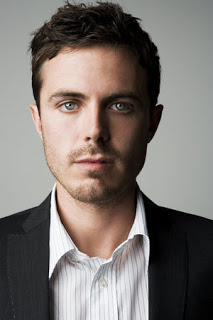

In [8]:
res = request.urlopen("http://4.bp.blogspot.com/-RUIeUkZfyUE/UTbCevt2l1I/AAAAAAAACLM/wPHKE3_aEos/s320/Casey+Affleck-2.jpg")
img = np.asarray(bytearray(res.read()), dtype="uint8")
img = cv2.imdecode(img, cv2.IMREAD_COLOR)
cv2_imshow(img)

We will apply the same preprocessing pipeline to this image as we do for our training and test set

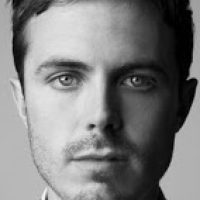

In [9]:
img_face_gs = convert_image(img)
cv2_imshow(img_face_gs)

Next, we will calculate the HOG feature vector for the image and explore the different parameter settings. We use the OpenCv 'HOGDescriptor' function to calculate the HOG feature vector. And we are using the SciKit 'hog' function to extract an image of the HOG feature vector result.

First of all, the window size is fixed to the size of the image: we are calculating a feature vector for the entire image (we have already extracted the face). The number of histogram bins is set to 9, which is the default.

First, we experiment a little bit with some different cell sizes (the patches for which the histogram is calculated. For now, we are keeping the blockSize and blockStride equal to the cellSize. Since we have a square image patch, we will use square cells.

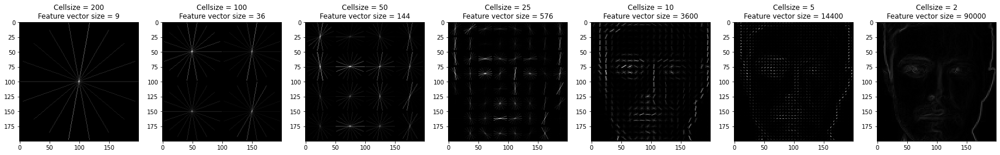

In [10]:
plt.figure(figsize=(30,5)) 

for idx, i in enumerate((200, 100, 50, 25, 10, 5, 2)):
  sp = plt.subplot(1, 7, idx+1)
  
  winSize = (200,200)
  cellSize = (i,i)
  blockSize = cellSize
  blockStride = cellSize
  nbins = 9

  hog_descr = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize, nbins)
  hog_features = hog_descr.compute(img_face_gs)
  fd, hog_image = hog(img_face_gs, orientations=nbins, pixels_per_cell=cellSize, cells_per_block=(1,1), visualize=True)
  hog_image_rs = exposure.rescale_intensity(hog_image, out_range=(0,255))

  sp.set_title("Cellsize = {}\nFeature vector size = {}".format(str(i), hog_features.shape[0]))
  plt.imshow(hog_image_rs, cmap='gray')

When a cell size of (200,200) is used, actually only 1 histogram of 9 bins is calculated (hence the feature vector has a size of 9). Each bin corresponds to a direction of the gradient vector calculated for that patch. The size of the bin corresponds to the size of the gradient vector for that direction, calculated for that patch. For a cell size of (100,100), 4 histograms with 9 bins are calculated, giving a feature vector of size 36. From the plot, it seems a cell size of 10 gives the best results. Choosing a cell size of 2 gives a feature vector of length 90 000, which would in fact defy the reason for using a feature descriptor - reducing the size of the input for a classification algorithm. Remark the initial size of the image is 200*200 = 40 000 pixel values.

By seeing these visualisations, it also becomes clear that this feature descriptor is influenced by the pose of the image as well as the alignment. As opposed to the previous grabbing assignment we are mostly capturing the gradient in this case, while in the previous assignment we focussed on the color and the circular shape of the ball. With HOG, we can detect more complex shapes.

Next, we will check the effect of the block size. Increasing the block size will enlarge the area over which normalization is applied, reducing the effect of illumination differences between images. We will use a block stride that is half the block size. This will increase the feature vector size, since the same cell can occur in multiple blocks, creating extra features. This feature vector becomes harder to visualize, but we will show a grayscale image of the feature vector to demonstrate the effect.

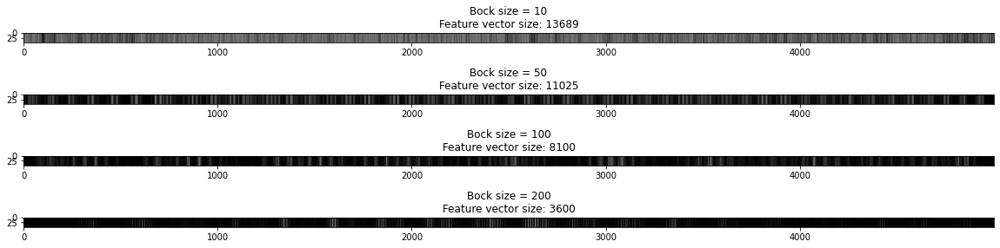

In [11]:
plt.figure(figsize=(20,5)) 

for idx, i in enumerate((10, 50, 100, 200)):
  sp = plt.subplot(4, 1, idx+1)
  
  winSize = (200,200)
  cellSize = (10,10)
  blockSize = (i,i)
  blockStride = (int(blockSize[0]/2), int(blockSize[1]/2))
  nbins = 9

  hog_descr = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
  hog_features = hog_descr.compute(img_face_gs)
  hog_image_rs = exposure.rescale_intensity(hog_features, out_range=(0,255))

  hog_image_rs = np.repeat(hog_image_rs, 50, axis=1)
  hog_image_rs = cv2.resize(hog_image_rs.transpose(), (5000,50))

  sp.set_title("Bock size = {}\nFeature vector size: {}".format(str(i), hog_features.shape[0]))
  plt.imshow(hog_image_rs, cmap='gray')


The effect of increasing the blocksize, is that the feature vector becomes 'smoother'. Remark that visualising this feature vector can be misleading. First of all, this is a linearised version fo the 2D-image, making it very hard to see which feature values were actually close together in the original image. Second, extra features have been created for the same cell, because of the block stride. Third, the values in the feature vector represent the values in the different bins per cell. We will use a block size of 50 in what follows.

In [0]:
# function that returns the hog feature vector based on an input image. 
# No preprocessing is needed on the input image and the default values can be used.
def extract_hog_features(image, cellSize = (10,10), blockSize = (50,50)):
  imgSize = image.shape  

  # calculate the hog feature vector
  hog_descr = cv2.HOGDescriptor(imgSize,blockSize,(int(blockSize[0]/2), int(blockSize[1]/2)),cellSize, 9)
  hog_features = hog_descr.compute(image)

  return hog_features

Next, we will try to measure the discriminative power of the HOG features by calculating the Euclidean distance of the hog features between the training images.

First, we will calculate the hog features for all the training images. The resulting list will contain the 10 hog feature vectors for subject A and subsequently the 10 hog feature vectors for subject B.

In [0]:
hog_features = []
for person in train_images:
  for img in person:
    hog = extract_hog_features(img)
    hog_features.append(hog)

Next, we will calculate the Euclidean distance between each feature vector.

In [0]:
dist_matrix = np.zeros((len(hog_features), len(hog_features)))
for idx1, feat1 in enumerate(hog_features):
  for idx2, feat2 in enumerate(hog_features):
        dist_matrix[idx1,idx2] = np.linalg.norm(feat1-feat2)

Displaying this distance matrix gives a view on the similarity between the different training images according to the HOG feature extraction.

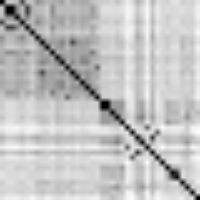

In [15]:
dist_matrix_img = cv2.resize(exposure.rescale_intensity(dist_matrix, out_range=(0,255)), (200,200))
cv2_imshow(dist_matrix_img)

As you can see, twee rectangular blocks seem to be formed: 1 for the first 10 images and 1 for the last 10 images, meaning the HOG feature extractor seems to be able to discriminate between person A and B, but we will quanitify the classification and identification abilities in a following chapter.

Another possible application of the HOG feature descriptor is to detect a face in a given image. We will test this by using our original image as a test image (after converting it to grayscale).

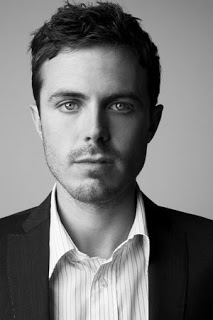

In [16]:
res = request.urlopen("http://4.bp.blogspot.com/-RUIeUkZfyUE/UTbCevt2l1I/AAAAAAAACLM/wPHKE3_aEos/s320/Casey+Affleck-2.jpg")
test_img_org = np.asarray(bytearray(res.read()), dtype="uint8")
test_img_org = cv2.imdecode(test_img_org, cv2.IMREAD_COLOR)
test_img = cv2.cvtColor(test_img_org, cv2.COLOR_BGR2GRAY)
cv2_imshow(test_img)

We will calculate the feature descriptor for different patches of this image and compare it to the hog feature vector of our face. We will extract patches for all possible positions in the original image, for different scales. 

In [0]:
# The different scales which we will tests and the steps in which we will move our patch detector (to increase the speed)
widths = [50, 100, 150, 200]
steps = [int(x / 10) for x in widths]

test_img_h = test_img.shape[0]
test_img_w = test_img.shape[1]

# Calculate the HOG features for the template in different scales
hog_patch_template = []
for w in widths:
  patch_template = cv2.resize(img_face_gs, (w,w))
  hog_patch_template.append(extract_hog_features(patch_template))

hog_patch_calc = []
for idx, w in enumerate(widths):
  result = np.empty((int((test_img_h - w) / steps[idx]) + 1, int((test_img_w - w) / steps[idx]) + 1))
  for j in range(0, test_img_w - w, steps[idx]):
    for i in range(0, test_img_h - w, steps[idx]):
      # extract the patch from the image for the current scale and position
      img_patch = test_img[i:i+w, j:j+w]
      # calculate the Euclidean distance between the feature vector of our extracted patch from the original image and our template
      result[int(i / steps[idx]), int(j / steps[idx])] = np.linalg.norm(extract_hog_features(img_patch) - hog_patch_template[idx])
      
  hog_patch_calc.append(result)

For every scale, we will find the patch with the minimum distance to the template patch and draw a green rectangle on the original image with the corresponding scale.

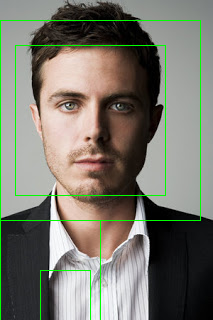

In [18]:
check_img = test_img_org.copy()
for idx, result in enumerate(hog_patch_calc):
  index = np.unravel_index(np.argmin(result), result.shape)
  index = [i * steps[idx] for i in index]
  cv2.rectangle(check_img, (index[1],index[0]), (index[1] + widths[idx], index[0] + widths[idx]), (0,255,0))
cv2_imshow(check_img)

As you can see, the face was detected by comparing the HOG features with our template. However, at smaller scales (in which the entire face doesn't fit in the patch), the face is not correctly detected, as expected. To make this work more smoothly, we would need to add a threshold to the detection to prevent detecting incorrect patches. And to make this work for completely new images, we would need a machine learning algorithm that can learn to extract a face based on HOG featrues that was trained with multiple images and different faces (also see the next chapters).

## 4.2 Learning features from data

In this part, we show how features can be learned from data. Namely we will take a look on computing eigenfaces and then on using pretrained neural network and how to extract features from it.

### 4.2.1 Unsupervised learning: PCA

First of all it is neccessary to process the images into more convenient form for computations. In an ideal case each image would have same shape/size and landmarks (eyes, nose,...) aligned in all images. As we have already done some preprocessing above - face extraction, conversion to grayscale and resizing to the same shape, we can continue. So now we need to transform our data into single 2D matrix in order to perform PCA. We can do that by reshaping images from [face_height, face_width] into [1, face_height * face_width]. Stacking all the images results in [#images, face_height * face_width] 2D matrix.

In [19]:
# Convert to numpy
def get_Xy(images, mean=False):
    img_count = 0
    for i in images: img_count += len(i)
    X = np.zeros((img_count, FACE_HEIGHT*FACE_WIDTH))
    y = np.zeros((img_count, 1))
    img_count = 0
    for p, person in enumerate(images):
        for img in person:
            y[img_count] = p
            X[img_count] = np.reshape(img, (FACE_HEIGHT*FACE_WIDTH))
            img_count += 1
    return X, y

X_train_pca, y_train_pca = get_Xy(train_images)
X_test_pca, y_test_pca = get_Xy(test_images)
print("X_train shape:", X_train_pca.shape, ", y_train shape:", y_train_pca.shape)
print("X_test shape:", X_test_pca.shape, ", y_test shape:", y_test_pca.shape)

X_train shape: (40, 40000) , y_train shape: (40, 1)
X_test shape: (40, 40000) , y_test shape: (40, 1)


The data have convenient form, but we need to do one more thing. Depending on the method of PCA, we have to or don't need to perform mean subtraction. As we are going to perform SVD, we have to center the data. Eigenvalue decomposition approach doesn't require data to be zero-centered as mean subtraction is involved in covariance matrix computation, which is done during the decomposition. (mean centering does not affect the covariance matrix)

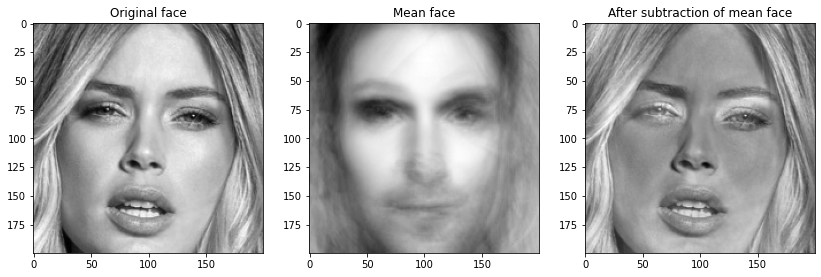

In [20]:
# Zero center the data
mean_train_pca = np.mean(X_train_pca, axis=0)
X_train_centered_pca = X_train_pca - mean_train_pca
X_test_centered_pca = X_test_pca - mean_train_pca

fig, axs = plt.subplots(1,3, figsize=(14, 12))
axs[0].imshow(train_images[1][2], 'gray')
axs[0].set_title('Original face')
axs[1].imshow(np.reshape(mean_train_pca, (FACE_HEIGHT, FACE_WIDTH)), 'gray')
axs[1].set_title('Mean face')
axs[2].imshow(train_images[1][2]-np.reshape(mean_train_pca, (FACE_HEIGHT, FACE_WIDTH)), 'gray')
axs[2].set_title('After subtraction of mean face')
plt.show()

With zero-centered data we can continue to PCA itself. There are two ways of computing eigenfaces, those were already mentioned in previous paragraph. First, we can compute covariance matrix (or correlation matrix) for our data matrix and then perform eigenvalue decomposition, providing eigenvectors and its eigenvalues. Second, we can use Singular Value Decomposition (SVD) approach, which is very convenient, much faster and poses softer assumptions on given matrix. There is no need to compute correlation matrix as SVD is performed directly on given matrix. Also due to all that we used SVD in this tutorial. SVD provides eigenvectors and singular values, which are square roots of eigenvalues. Both approaches should provide at least *k* non-zero eigenvalues/singular values. The number of non-zero singular values is the same as the rank of given data matrix. The bigger the i-th eigenvalue/singular value the bigger contribution of i-th eigen vector to the reconstruction (projection of image to reduced space), typically.

Either by SVD or by eigenvalue decomposition we can get our eigenvectors and eigenvalues. By reshaping returned eigenvectors from shape [1, face_height * face_width] to [face_height, face_width] we get the required eigenfaces. To summarize, both approaches provide conceptually same output, but SVD offers more convenient way of doing so.

Keep in mind that by performing PCA we are trying to reduce dimensionality of data from some dimension *n* to dimension *k*, where *k* < *n* and ideally with minimal loss of quality on representation. In this case, the initial dimension *n* is the number of training images and reduced dimension *k* is the number of images (eigenfaces) which will be used for representatiton. In different words, we will represent original image by linear combination of eigenfaces, so those eigenfaces (eigenvectors) constitute new space in which original images will be represented.

X shape: (40, 40000)
U shape: (40, 40)
S shape: (40,)
V shape: (40, 40000)
20 biggest singular values:
 [32229.3516991  23713.00506731 18404.46986043 15621.11053121
 13808.30658657 12570.11176563 12165.90367596 10955.45373798
 10494.30481494  9751.09834766  9326.995117    8431.50112697
  8186.31980924  7787.03450388  7488.90157338  7187.23408035
  6586.19818015  6424.2588548   6266.22320151  6163.03352829]


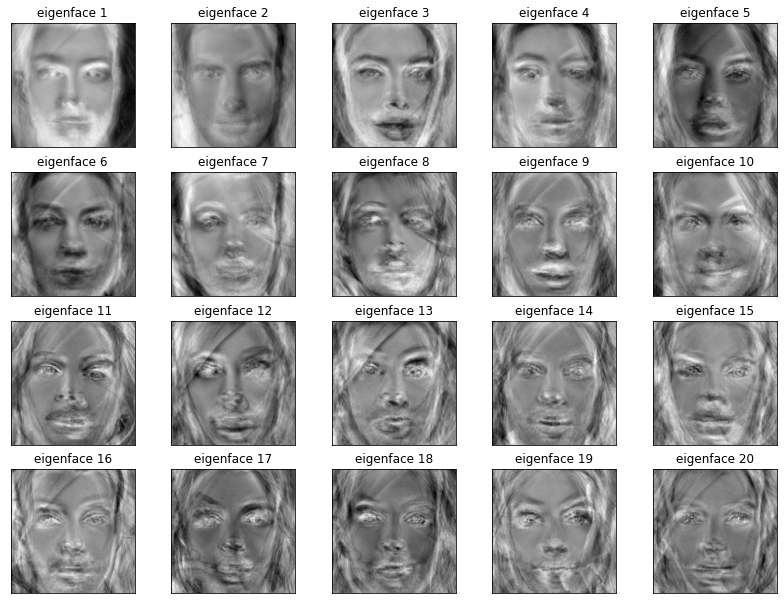

In [21]:
# SVD: X = U*S*V^T
def svd(data, k, printout=False):
    U, S, V = np.linalg.svd(data, full_matrices=False)
    if printout:
        print("X shape:", data.shape)
        print("U shape:", U.shape)
        print("S shape:", S.shape)
        print("V shape:", V.shape)
        print(k, "biggest singular values:\n", S[:k])
    components = V[:k]  # first k eigenvectors = the biggest k eigenvalues
    projection = U[:,:k]*S[:k]
    return components, projection

def plot_faces(images, names, n_row, n_col):
    plt.figure(figsize=(2.2 * n_col, 2.2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.20)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((FACE_HEIGHT, FACE_WIDTH)), 'gray')
        if len(names) > 0: plt.title(names[i])
        plt.xticks(())
        plt.yticks(())
        
k_components = 20
components, projection = svd(X_train_centered_pca, k_components, True)
eigenfaces = components.reshape((k_components, FACE_HEIGHT, FACE_WIDTH))
plot_faces(eigenfaces, ['eigenface {}'.format(i+1) for i in range(k_components)], 4, 5) 

You can notice that first eigenface activates mostly along face contour, eybrows and beard. Second eigenface captures the male face. The third eigenface captures woman face with contour along face and eybrows. The eigenfaces are ordered by importance (by singular value).

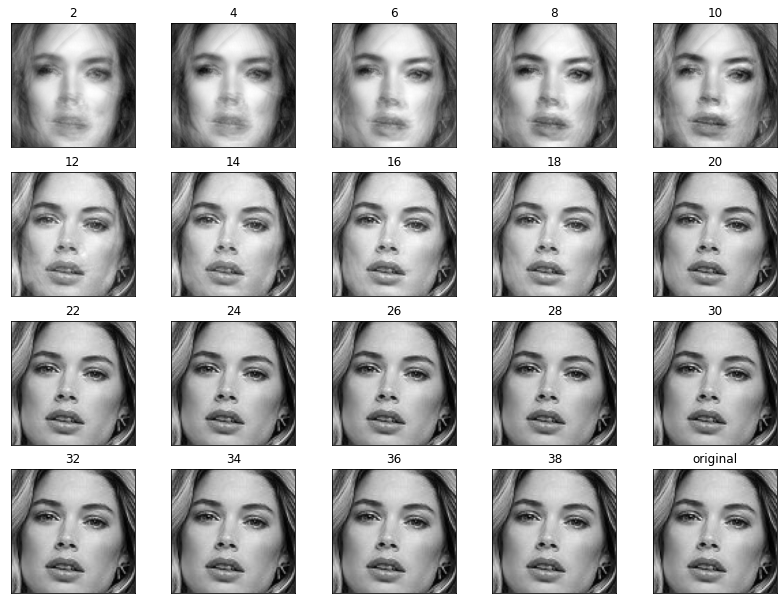

In [22]:
# Reconstruct image -- projection of original image onto k-components (eigenfaces) space
def reconstruct(data, components, mean, index=False):
    weights = np.dot(data, components.T)
    if index:
        centered_vector = np.dot(weights[index, :], components)
        return (mean + centered_vector).reshape(FACE_HEIGHT, FACE_WIDTH)
    else:
        recovered_images = []
        for i in range(data.shape[0]):
            centered_vector = np.dot(weights[i, :], components)
            recovered_images.append((mean + centered_vector))
        return recovered_images

# Return reconstruction loss between original and reconstructed image
def reconstruction_loss(inp, out, loss='mse'):
    assert inp.shape == out.shape
    if loss == 'mse':
        mse = np.square(inp - out).mean(1)
        return np.mean(mse)


faces, k_components = [],   [2, 4, 6, 8, 10,
                            12, 14, 16, 18, 20,
                            22, 24, 26, 28, 30,
                            32, 34, 36, 38]
loss = []
for k in k_components:
    components, projection = svd(X_train_centered_pca, k)
    reconstructed = reconstruct(X_train_centered_pca, components, mean_train_pca)
    loss.append(reconstruction_loss(X_train_centered_pca, np.array(reconstructed)))
    faces.append(reconstructed[21].reshape(FACE_HEIGHT, FACE_WIDTH))

# append original face
faces.append(train_images[1][1])
plot_faces(faces, k_components+['original'], n_row=4, n_col=5)

Basically, the reconstruction is weighted stacking of different eigenfaces or we can see it as linear combination of eigenfaces. Below we can see, how number of eigenfaces can affect the quality of representation. The representaiton starts to look very good since 20, 22, 24 eigenfaces used. Generally, with more data and more variability in those data it could be even less, I believe.

Below plot illustrates how accurate is reconstruction based on number of components. Naturally, one want to push as much as possible in direction to origin so to the bottom left corner. It comes with a natural tradeoff as with too big *k* the effect of dimensionality reduction will be negligible and with *k* too small the representation will be of poor quality. After performing PCA we obtain at least *k* non-zero eigenvalues of *k* eigenvectors which define our new k-dimensional space. In other words, we are looking for k-dimensions which cover most of the variability in data. According to the plot, sufficient number of eigenfaces (dimension *k*) is around 20.

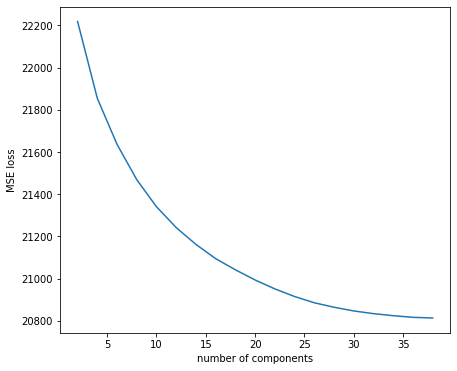

In [23]:
plt.figure(figsize=(7,6))
plt.plot(k_components, loss)
plt.ylabel('MSE loss')
plt.xlabel('number of components')
plt.show()

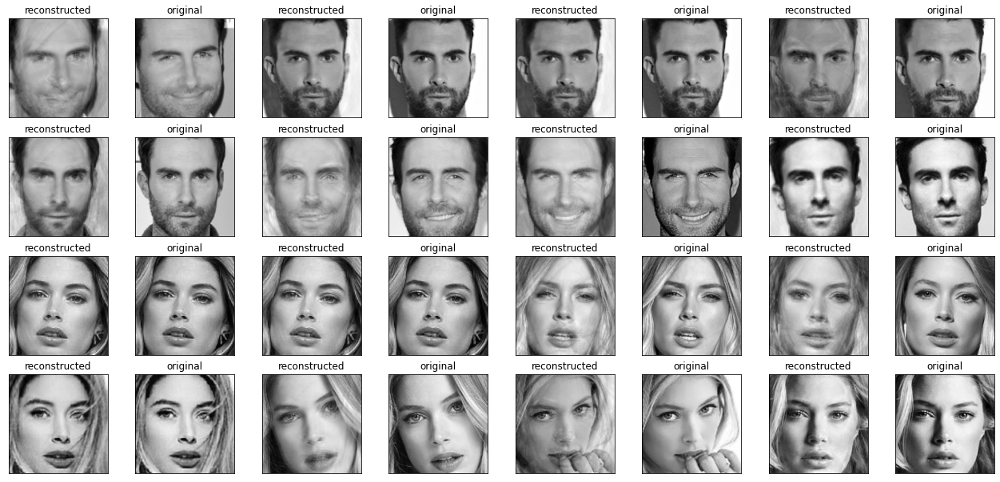

In [24]:
# reconstructed training data
sample = [0,1,2,3,10,11,12,13,20,21,22,23,30,31,32,33]
k_components = 20

components, _ = svd(X_train_centered_pca, k_components)
reconstructed = reconstruct(X_train_centered_pca, components, mean_train_pca)
reconstructed_sample = [reconstructed[i] for i in sample]

# original data
original = [X_train_pca[i].reshape(FACE_HEIGHT, FACE_WIDTH) for i in sample]
faces, titles = [], []
for i in range(len(original)):
    faces.append(reconstructed_sample[i])
    faces.append(original[i])
    titles.append('reconstructed')
    titles.append('original')
plot_faces(faces, titles, n_row=4, n_col=8)

Reconstruction of training images with using only 20 eigenfaces looks reasonably well. All the above images were the training ones. But we are interested whether we can represent a never seen image by our eigenfaces. Lets take a look on that.

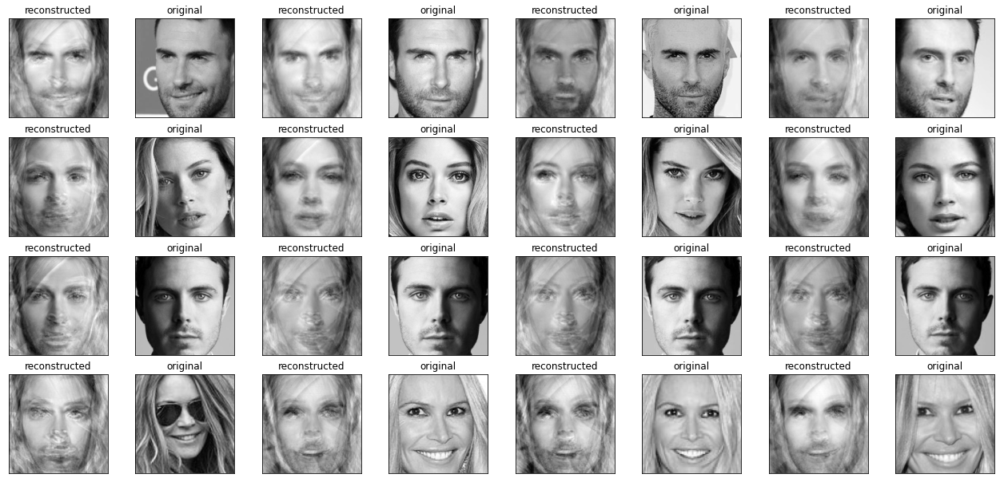

In [25]:
# reconstructed test data
reconstructed = reconstruct(X_test_centered_pca, components, mean_train_pca)
reconstructed_sample = [reconstructed[i] for i in sample]

# original data
original = [X_test_pca[i].reshape(FACE_HEIGHT, FACE_WIDTH) for i in sample]
faces, titles = [], []
for i in range(len(original)):
    faces.append(reconstructed_sample[i])
    faces.append(original[i])
    titles.append('reconstructed')
    titles.append('original')
plot_faces(faces, titles, n_row=4, n_col=8)

That seems a liitle bit worse and the unseen faces (rows 3 and 4) even substantially worse, doesn't it? The approach struggle as it never saw a glasses and thus there are no chance of seeing them in projections. Also the quality of faces is much worse, especially the last two rows, where are persons not included in training set. So now, lets try to plot projections onto the first two eigenfaces space.

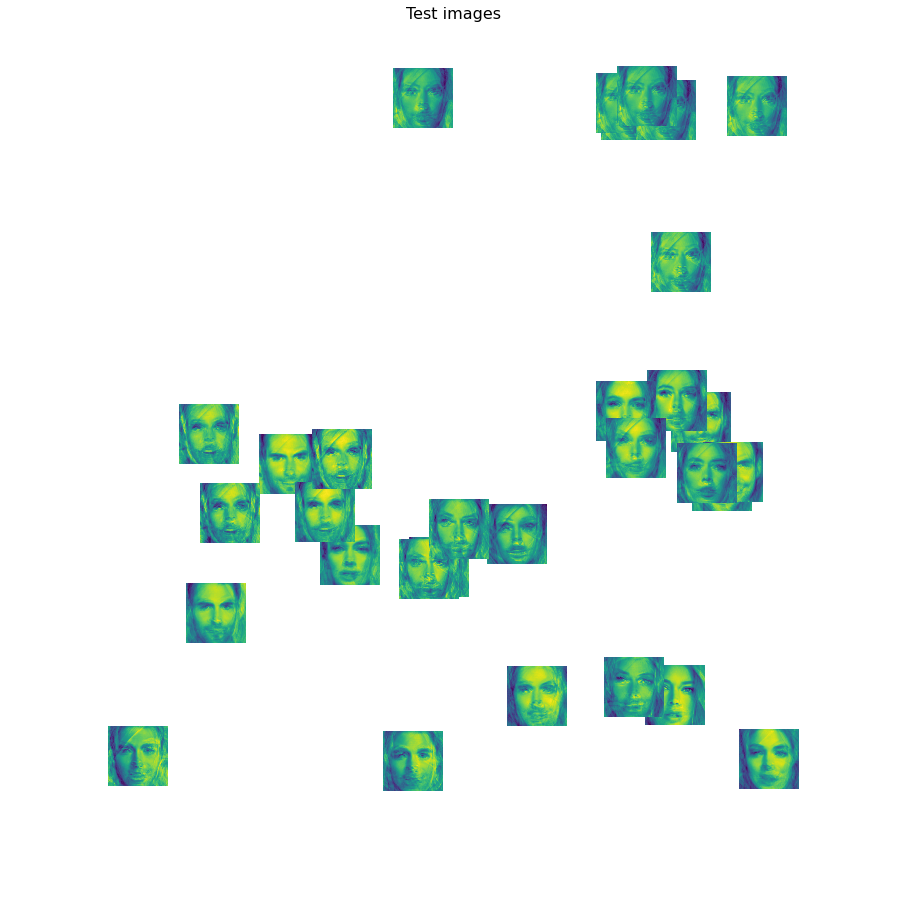

In [26]:
def scatter_images_plot(x, y, images, title, figsize=(16, 16), image_zoom=0.3):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for x, y, i in zip(x, y, images):
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x, y), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.set_xlabel('eigenface 1')
    ax.set_ylabel('eigenface 2')
    ax.axis('off')
    plt.title(title, fontsize=16)
    plt.show()

# Test data projected onto p-componets space
X_test_projection = np.matmul(X_test_centered_pca, components.T)
x_test = [(x-np.mean(X_test_projection[:, 0]))/max(X_test_projection[:, 0]) for x in X_test_projection[:, 0]]
y_test = [(y-np.mean(X_test_projection[:, 1]))/max(X_test_projection[:, 1]) for y in X_test_projection[:, 1]]
scatter_images_plot(x_test, y_test, [r.reshape(FACE_HEIGHT, FACE_WIDTH) for r in reconstructed], "Test images")

# Train data projected onto p-componets space
# X_train_projection = np.matmul(X_train_centered_pca, components.T)
# x_train = [(x-np.mean(X_train_projection[:, 0]))/max(X_train_projection[:, 0]) for x in X_train_projection[:, 0]]
# y_train = [(y-np.mean(X_train_projection[:, 1]))/max(X_train_projection[:, 1]) for y in X_train_projection[:, 1]]
# scatter_images_plot(x_train, y_train, [r.reshape(FACE_HEIGHT, FACE_WIDTH) for r in reconstructed], "Train images")

In [0]:
# Prepare features for futher classification and identification
def get_features_pca(k_components):
    X_train_pca, y_train_pca = get_Xy(train_images)
    X_test_pca, y_test_pca = get_Xy(test_images)
    X_train_pca_centered = X_train_pca - np.mean(X_train_pca, axis=0)
    X_test_pca_centered = X_test_pca - np.mean(X_train_pca, axis=0)

    eigenvectors, _ = svd(X_train_centered_pca, k_components)

    X_train_pca_features = np.matmul(X_train_centered_pca, eigenvectors.T)
    y_train_pca_features = []
    for i in range(2): y_train_pca_features.extend([i]*20)

    X_test_pca_features = np.matmul(X_test_centered_pca, eigenvectors.T)
    y_test_pca_features = []
    for i in [0, 1, 0, 1]: y_test_pca_features.extend([i]*10)
    return X_train_pca_features, y_train_pca_features, X_test_pca_features, y_test_pca_features

### 4.2.2 Transfer Learning

The features for our images can be constructed by using already pretrained NN. In order to do so, our images are inputed to the pretrained NN and processed. The original NN was used for classification. In our case we remove the last classification layer and extract the embedding from the layer before the classification one. At the end, we obtain an embedding vector for given input.

Model expects inputs in shape (224, 224, 3), which means there is need to preprocess the images in order to get that shape. Or it is possible to use the same preprocessing which was used for vggface model -- preprocess_input function.

In [28]:
# INSTALL VGGFACE PACKAGE AND OPENCV TOOL FOR FACE EXTRACTION
!pip install keras_vggface

In [29]:
from keras.layers import Input
from keras import Model
from keras_vggface.vggface import VGGFace

import warnings
warnings.filterwarnings('ignore')

from PIL import Image
from keras_vggface.utils import preprocess_input

from scipy.spatial.distance import cosine, euclidean, pdist, squareform
from numpy import expand_dims

Using TensorFlow backend.


In [30]:
# CONVOLUTION FEATURES
# pooling=avg, so that the filter maps at the output end of the model are reduced to a vector using global average pooling
model = VGGFace(include_top=False, input_shape=(224, 224, 3), pooling='avg')
print(model.inputs)
print(model.outputs)

faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

58916864/58909280 [==============================] - 5s 0us/step
[<tf.Tensor 'input_1:0' shape=(?, 224, 224, 3) dtype=float32>]
[<tf.Tensor 'global_average_pooling2d_1/Mean:0' shape=(?, 512) dtype=float32>]


In [0]:
# GET RESIZED IMAGES TO (224,224,3) SHAPE
def get_resized(image):
    img = Image.fromarray(image)
    img = img.resize((224, 224))
    im_resized = np.asarray(img)
    return im_resized

# EXTRACT FACES AND GET FACE EMBEDDINGS
def get_embeddings(images, model):
    faces = [get_resized(img) for pimgs in images for img in pimgs]
    samples = np.asarray(faces, 'float32')
    # samples = preprocess_input(samples, version=2)
    y = model.predict(samples)
    return y

# COMPUTE DISTANCE BETWEEN TWO EMBEDDINGS
def get_distance(em1, em2, cos=False):
    if cos:
        dist = cosine(em1, em2)
    else:
        dist = euclidean(em1, em2)
    return dist

# COMPUTE PAIRWAISE DISTANCES
def get_pdistances(embeddings, cos=False):
    if cos:
        dist = pdist(embeddings, 'cosine')
    else:
        dist = pdist(embeddings, 'euclidean')
    return squareform(dist)

In [32]:
# GET EMBEDDINGS
emb = get_embeddings(train_images_org, model)
print("Number of images x embedding dimension", emb.shape)

# COMPUTE DISTANCES BETWEEN FACE EMBEDDINGS
distances = get_pdistances(emb) + np.eye(len(emb))
print("Distance matrix shape", distances.shape, "\n")#, distances)


Number of images x embedding dimension (40, 512)
Distance matrix shape (40, 40) 



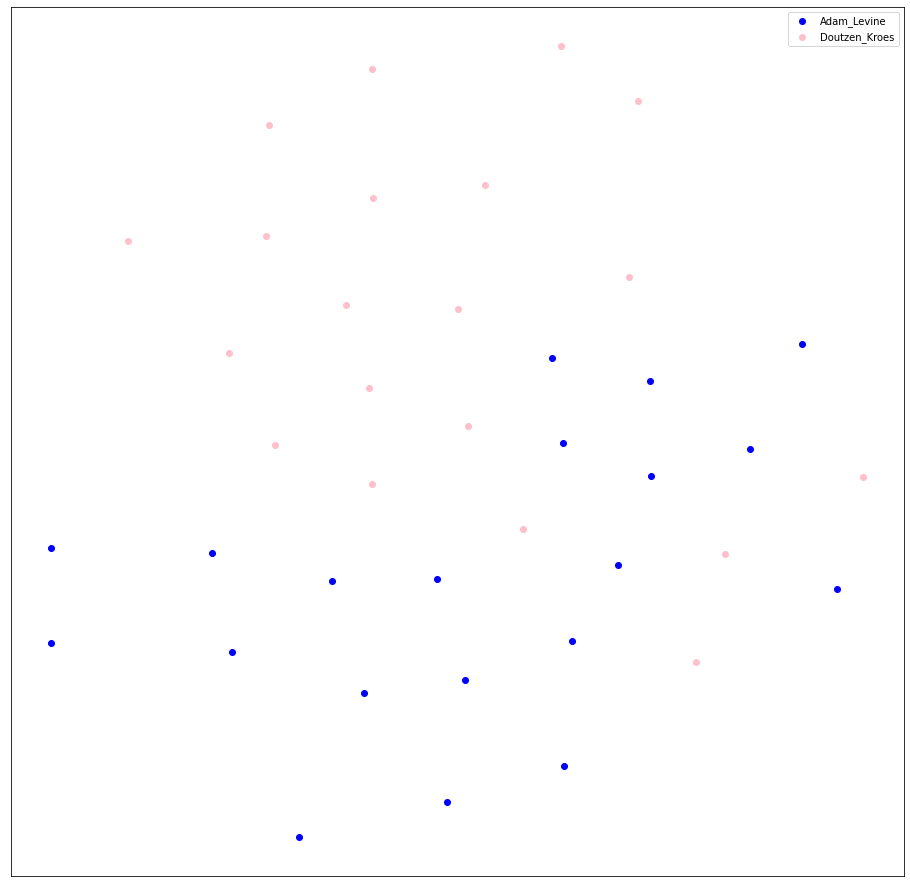

In [33]:
# DIMENSION REDUCTION OF EMBEDDINGS AND THEIR VISUALIZATION
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=1, method='exact')
reddim = tsne.fit_transform(emb)

fig, ax = plt.subplots(figsize=(16, 16))
c1 = plt.scatter(x=reddim[:20,0], y=reddim[:20,1], c='blue', label=face_files[0].replace('.txt', ''))
c2 = plt.scatter(x=reddim[20:40,0], y=reddim[20:40,1], c='pink', label=face_files[1].replace('.txt', ''))

plt.legend()
ax.set_xticks([])
ax.set_yticks([])
plt.show()

It seems that extracted features can realtively well discriminate the classes. Even though it is not possible to separate the data linearly.

In [0]:
def get_features_nn():
    X_train_embed = get_embeddings(train_images_org, model)
    X_test_embed = get_embeddings(test_images_org, model)

    y_train, y_test = [], []
    for i in range(2): y_train.extend([i]*20)
    for i in [0,1,0,1]: y_test.extend([i]*10)
    return X_train_embed, y_train, X_test_embed, y_test

# 5. EXPLOIT FEATURE REPRESENTATIONS

In [0]:
from sklearn import svm
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve, auc, classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

## 5.1 Classification

For the classification of the images we will use support vector machines. This are binary classifiers that find the best hyperplane that separates the datapoints of the two classes. This separation can be linear or nonlinear this can be done by using different kernels. We will explore the performance of the linear kernel and the RBF kernel on the classification of the image datasets.
From the scikit-learn library we will use the SVC function to make a support vector classifier. Furthermore the function GridSearchCV is used which performs an exhaustive search over the given parameter values of the linear and RBF kernels such that we are able to select the best parameter values for a given score (accuracy, recall and precision in our case).

**Classification of handcrafted features**

In [36]:
#construct training set
train_img = train_im_class

train_hog = []
y_train_hog = []


label = 0

for person in train_img:
  for img in person:
    k = np.concatenate(extract_hog_features(img), axis=None)
    train_hog.append(k)
    y_train_hog.append(label)
  label+=1

train_hog = np.asarray(train_hog)
y_train_hog = np.asarray(y_train_hog)


#construct test set
test_img = test_im_class
test_hog = []
y_test_hog = []

label = 0

for person in test_img:
  for img in person:
    k = np.concatenate(extract_hog_features(img), axis=None)
    test_hog.append(k)
    y_test_hog.append(label)
  label+=1


test_hog = np.asarray(test_hog)
y_test_hog = np.asarray(y_test_hog)
y_test_hog[20:30] = y_test_hog[20:30]-2
y_test_hog[30:] = y_test_hog[30:]-2
print(train_hog.shape)


(40, 11025)


Now the performance of a linear kernel and RBF kernel on the faces of persons A and B will be compared by using gridsearch. Eventually the two classifiers that perform best on the recall score (tp/(tp+fn)) and the precision score (tp / (tp + fp)) will be selected to classify the faces of persons C and D.

In [37]:
#A&B
X = np.concatenate((train_hog[:40],test_hog[0:20]),axis=0)
y = np.append(y_train_hog[:40], y_test_hog[:20])
param_grid = [{'C': [1, 10, 100, 1000], 'kernel': ['linear']},
                {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']}]
scores = ['accuracy', 'precision', 'recall']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/3, random_state=0)

classifiers = []

for score in scores:
    print("Tuning hyper-parameters for ", score)
    print()
    clf = GridSearchCV(svm.SVC(), param_grid, scoring=score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    classifiers.append(clf)
    print('True negatives: ', tn)
    print('False positives: ', fp)
    print('False negatives: ', fn)
    print('True positives: ', tp)
    print()

Tuning hyper-parameters for  accuracy

Best parameters set found on development set:

{'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

True negatives:  10
False positives:  0
False negatives:  0
True positives:  10

Tuning hyper-parameters for  precision

Best parameters set found on development set:

{'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

      

We see that when we optimise for the precision score(tp/(tp + fp)) the RBF kernel with C = 1 and gamma = 0.001 performs best. While the optimisation for the recall score (tp/(tp+fn)) a linear kernel with C = 1 has the best performance. Now the performance of both classifiers will be tested on sets C and D with set C similar to A and set D similar to B.

In [38]:
clf = classifiers[1]
classifier_for_end = classifiers[1]
X = test_hog[20:]
y = y_test_hog[20:]

y_true, y_pred = y, clf.predict(X)
print(classification_report(y_true, y_pred))
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('True negatives: ', tn)
print('False positives: ', fp)
print('False negatives: ', fn)
print('True positives: ', tp)

              precision    recall  f1-score   support

           0       0.69      0.90      0.78        10
           1       0.86      0.60      0.71        10

    accuracy                           0.75        20
   macro avg       0.77      0.75      0.74        20
weighted avg       0.77      0.75      0.74        20

True negatives:  9
False positives:  1
False negatives:  4
True positives:  6


The performance of the linear classifier is best on the HOG feature representation of sets C and B. The acquired accuracy is 75%.

**Classification of PCA data**

By first applying PCA on the data we can reduce the feature space of the data drastically. We compute the SVD of the zero centered training data and afterwards we train the classifier on the selected principal components. When we try to predict the test data by applying the same transformation as on the train set, i.e. the mean of the training data is subtracted from the test data and afterwards the zero centered test data is projected onto the principal components of the training data. For the selection of the optimal classifier we follow the same methodology as above i.e. we will use GridSearchCV to find the optimal classifier for the recall score. We will do this for varying the amount of principal components ranging from 10 to 20.

It is important to split the train and testing data before doing the principal component analysis. If the PCA is done before the train/test-split information from the test set will leak into the training set and the classifier will know the test data.

Training on sets A and B:

Tuning hyper-parameters for  accuracy

Best parameters set found on development set:

{'C': 1, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       0.91      1.00      0.95        10

    accuracy                           0.95        20
   macro avg       0.95      0.95      0.95        20
weighted avg       0.95      0.95      0.95        20

True negatives:  9
False positives:  1
False negatives:  0
True positives:  10

Tuning hyper-parameters for  accuracy

Best parameters set found on development set:

{'C': 1, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       1.00      0.90 

Text(0.5, 0.98, 'Classifier accuracy depending on the number of principal components')

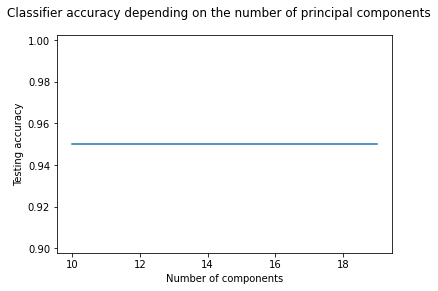

In [39]:
#A&B

components = range(10,20)
scores = ['accuracy']
param_grid = [{'C': [1, 10, 100, 1000], 'kernel': ['linear']},
                {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']}]

classifiersPCA = []
scoresl = {}
scores_list = []

for comp in components:
  X_train, y_train, X_test, y_test = get_features_pca(comp)
  X_testAB = X_test[:20]
  y_testAB = y_test[:20]
  y_testAB = np.asarray(y_testAB)

  for score in scores:
    print("Tuning hyper-parameters for ", score)
    print()
    clf = GridSearchCV(svm.SVC(), param_grid, scoring=score)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_testAB, clf.predict(X_testAB)
    print(classification_report(y_true, y_pred))
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    classifiersPCA.append(clf)
    print('True negatives: ', tn)
    print('False positives: ', fp)
    print('False negatives: ', fn)
    print('True positives: ', tp)
    print()
    scoresl[components] = accuracy_score(y_true, y_pred)
    scores_list.append(accuracy_score(y_true, y_pred))


fig = plt.figure()
plt.plot(components, scores_list)
plt.xlabel('Number of components')
plt.ylabel('Testing accuracy')
fig.suptitle('Classifier accuracy depending on the number of principal components')

When optimising the classifiers on the accuracy score an accuracy of 95% is reached on test sets A and B on independent of the amount of principal components if a linear kernel with C = 1 is used.

Checking performance on sets C and D:

Text(0, 0.5, 'Testing accuracy')

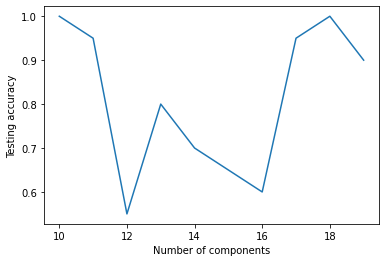

In [40]:
scoresl = {}
scores_list = []

for i in range(len(components)):
  comp = components[i]
  X_train, y_train, X_test, y_test = get_features_pca(comp)
  X_testCD = X_test[20:]
  y_testCD = y_test[20:]
  y_testCD = np.asarray(y_testCD)
  clf = classifiersPCA[i]
  y_true, y_pred = y_testCD, clf.predict(X_testCD)
  scoresl[comp] = accuracy_score(y_true, y_pred)
  scores_list.append(accuracy_score(y_true, y_pred))


plt.figure()
plt.plot(range(10,20), scores_list)
plt.xlabel('Number of components')
plt.ylabel('Testing accuracy')

In [41]:
print(scores_list)

[1.0, 0.95, 0.55, 0.8, 0.7, 0.65, 0.6, 0.95, 1.0, 0.9]


When the same classifiers are used on sets C and D the accuracy ranges between 100% and 55%. PCA is primarily used on the training of classifiers to reduce the dimension of the feature space in high dimensional data. This dimensionality reduction is a way to reduce the complexity of the model and a way to reduce overfitting. It is thus clear that in the selection of the optimal classifier we should select the first on which is a linear kernel with C=1 and trained on ten principal components.

**Classification with TL features**

In [42]:
X_train, y_train, X_test, y_test = get_features_nn()
y_train = np.asarray(y_train)
y_test = np.asarray(y_test)

X_testAB = X_test[:20]
y_testAB = y_test[:20]

X_testCD = X_test[20:]
y_testCD = y_test[20:]

print(X_train.shape)

(40, 512)


Training on sets A and B:

In [43]:
classifiers = []
param_grid = [{'C': [1, 10, 100, 1000], 'kernel': ['linear']},
                {'C': [1, 10, 100, 1000], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']}]
scores = ['accuracy', 'precision', 'recall']

for score in scores:
    print("Tuning hyper-parameters for ", score)
    print()
    clf = GridSearchCV(svm.SVC(), param_grid, scoring=score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_testAB, clf.predict(X_testAB)
    print(classification_report(y_true, y_pred))
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    classifiers.append(clf)
    print('True negatives: ', tn)
    print('False positives: ', fp)
    print('False negatives: ', fn)
    print('True positives: ', tp)
    print()

Tuning hyper-parameters for  accuracy

Best parameters set found on development set:

{'C': 1, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      0.90      0.95        10

    accuracy                           0.95        20
   macro avg       0.95      0.95      0.95        20
weighted avg       0.95      0.95      0.95        20

True negatives:  10
False positives:  0
False negatives:  1
True positives:  9

Tuning hyper-parameters for  precision

Best parameters set found on development set:

{'C': 1, 'kernel': 'linear'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           0       0.91      1.00

Checking performance on sets C and D:

In [44]:
for clf in classifiers:
  y_true, y_pred = y_testCD, clf.predict(X_testCD)
  print(classification_report(y_true, y_pred))
  tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
  print('True negatives: ', tn)
  print('False positives: ', fp)
  print('False negatives: ', fn)
  print('True positives: ', tp)
  print()


              precision    recall  f1-score   support

           0       0.59      1.00      0.74        10
           1       1.00      0.30      0.46        10

    accuracy                           0.65        20
   macro avg       0.79      0.65      0.60        20
weighted avg       0.79      0.65      0.60        20

True negatives:  10
False positives:  0
False negatives:  7
True positives:  3

              precision    recall  f1-score   support

           0       0.59      1.00      0.74        10
           1       1.00      0.30      0.46        10

    accuracy                           0.65        20
   macro avg       0.79      0.65      0.60        20
weighted avg       0.79      0.65      0.60        20

True negatives:  10
False positives:  0
False negatives:  7
True positives:  3

              precision    recall  f1-score   support

           0       0.59      1.00      0.74        10
           1       1.00      0.30      0.46        10

    accuracy          

The accuracy of a linear kernel with C = 1 on test sets A and B is 95%, while the accuracy of the same classifier on sets C and D is 65%.

**Conclusion**

First a breef recap of the best findings made for the different feature representations:


*   HOG: number of features: 11025; accuracy on A and B: 95%; accuracy on C and D: 75%

*   PCA: number of features: 10; accuracy on A and B: 95%; accuracy on C and D: 100%
*   TL: number of features: 512; accuracy on A and B: 95%; accuracy on C and D: 65%

Our conclusion depends on the goal of the classification. If we want to be able to best classify faces that show similarity with sets A and B, but aren't nessecarily the faces of the same people, the PCA is our go to. Due to the




## 5.2 Identification

In an identification setting the images are classified by using the k-Nearest-Neighbour algorithm. A data point is now classified by looking at the k training datapoints to which it lies closest (we use the euclidian distance). The new data point gets the label which is most frequent among these k neighbours. By weighing data by the inverse of their distance, closer neigbours of a query point will have greater influence in its identification. We will select the best identificator by looking at the performance for a varying number of neighbours.

**HOG feature representation**

The HOG feature representation will be used on the KNN identification.

Training on sets A and B:

Text(0.5, 0.98, 'Unweighted identification')

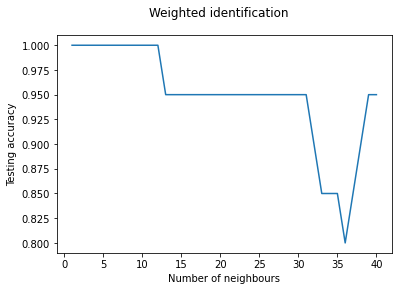

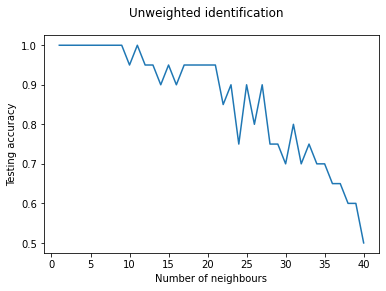

In [45]:
X = np.concatenate((train_hog[:40],test_hog[0:20]),axis=0)
y = np.append(y_train_hog[:40], y_test_hog[:20])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/3, random_state=0)
nb_range = range(1,41)
scores = {}
scores_list = []
scores2 = {}
scores_list2 = []
classifiers = []
for nb in nb_range:
  knn2 = KNeighborsClassifier(n_neighbors=nb)
  knn = KNeighborsClassifier(n_neighbors=nb, weights='distance')
  knn.fit(X_train, y_train)
  knn2.fit(X_train, y_train)
  y_pred = knn.predict(X_test)
  y_pred2 = knn2.predict(X_test)
  scores[nb] = accuracy_score(y_test, y_pred)
  scores_list.append(accuracy_score(y_test, y_pred))
  classifiers.append(knn)
  scores2[nb] = accuracy_score(y_test, y_pred2)
  scores_list2.append(accuracy_score(y_test, y_pred2))
  


fig1 = plt.figure()
plt.plot(nb_range, scores_list)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig1.suptitle('Weighted identification')

fig2 = plt.figure()
plt.plot(nb_range, scores_list2)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig2.suptitle('Unweighted identification')

It is clear that overall the classifier using the weighted distance performs best with its accuracy score staying between 100% and 80% for the number of neigbours ranging between 1 and 40. When we look at the unweigthed classifier we see that the accuracy is inversely proportionate to the number of neighbours. When the number of neighbours is 40 the identification essentially becomes a coin flip. We will use the weighted classifier to try to classify sets C and D.

Text(0, 0.5, 'Testing accuracy')

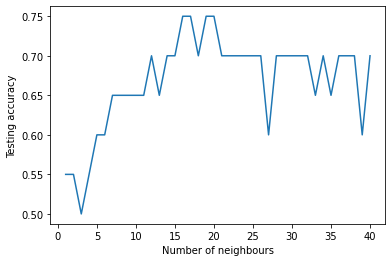

In [46]:
X = test_hog[20:]
y = y_test_hog[20:]

scores = {}
scores_list = []

for knn in classifiers:
  y_pred = knn.predict(X)
  """
  print(classification_report(y, y_pred))
  tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()
  print('True negatives: ', tn)
  print('False positives: ', fp)
  print('False negatives: ', fn)
  print('True positives: ', tp)
  """
  scores[nb] = accuracy_score(y, y_pred)
  scores_list.append(accuracy_score(y, y_pred))


plt.figure()
plt.plot(nb_range, scores_list)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')

The performance on sets C and D is best when the number of neighbours is higher. However with an accuracy that lies around 70% for the number of neigbours higher than 15,the classifier is best used on sets that are very similar to A and B.

**PCA feature representation**

The PCA feature representation will be used on the KNN identification.

Training on sets A and B:

Text(0.5, 0.98, 'Number of principal components: 20')

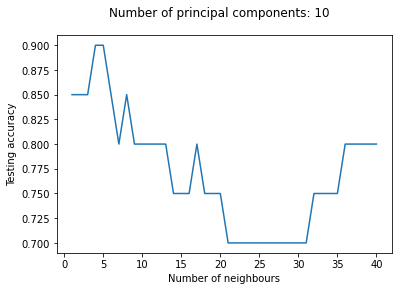

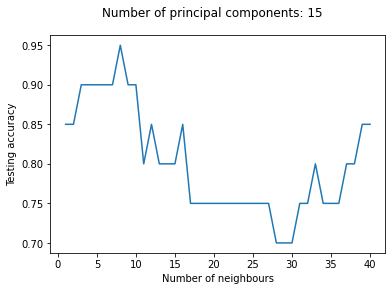

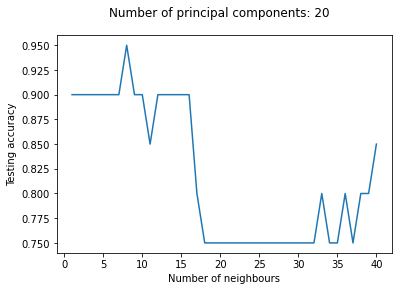

In [47]:
k = [10, 15, 20]
nb_range = range(1,41)
classifiers1 = []
classifiers2 = []
classifiers3 = []

scores1 = {}
scores_list1 = []

scores2 = {}
scores_list2 = []

scores3 = {}
scores_list3 = []

for nb in nb_range:
  X_train, y_train, X_test, y_test = get_features_pca(10)
  X_testAB = X_test[:20]
  y_testAB = y_test[:20]
  y_testAB = np.asarray(y_testAB)

  knn = KNeighborsClassifier(n_neighbors=nb, weights='distance')
  knn.fit(X_train, y_train)
  y_pred = knn.predict(X_testAB)
  scores1[nb] = accuracy_score(y_testAB, y_pred)
  scores_list1.append(accuracy_score(y_testAB, y_pred))
  classifiers1.append(knn)

for nb in nb_range:
  X_train, y_train, X_test, y_test = get_features_pca(15)
  X_testAB = X_test[:20]
  y_testAB = y_test[:20]
  y_testAB = np.asarray(y_testAB)

  knn = KNeighborsClassifier(n_neighbors=nb, weights='distance')
  knn.fit(X_train, y_train)
  y_pred = knn.predict(X_testAB)
  scores2[nb] = accuracy_score(y_testAB, y_pred)
  scores_list2.append(accuracy_score(y_testAB, y_pred))
  classifiers2.append(knn)

for nb in nb_range:
  X_train, y_train, X_test, y_test = get_features_pca(20)
  X_testAB = X_test[:20]
  y_testAB = y_test[:20]
  y_testAB = np.asarray(y_testAB)

  knn = KNeighborsClassifier(n_neighbors=nb, weights='distance')
  knn.fit(X_train, y_train)
  y_pred = knn.predict(X_testAB)
  scores3[nb] = accuracy_score(y_testAB, y_pred)
  scores_list3.append(accuracy_score(y_testAB, y_pred))
  classifiers3.append(knn)

fig1 = plt.figure()
plt.plot(nb_range, scores_list1)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig1.suptitle('Number of principal components: 10')

fig2 = plt.figure()
plt.plot(nb_range, scores_list2)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig2.suptitle('Number of principal components: 15')
  
fig3 = plt.figure()
plt.plot(nb_range, scores_list3)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig3.suptitle('Number of principal components: 20')

We can see that when PCA is used it is best not to choose the number of naigbours too high as high k will result in overfitting of the classifier on the training data. However, when a higher number of PC's is used, k can be chosen to be larger before overfitting on the training set starts to occur.

Now the classifiers will be tested on sets C and D

Text(0.5, 0.98, 'Number of principal components: 20')

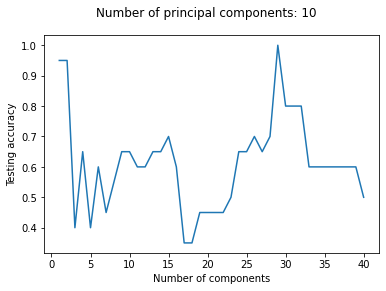

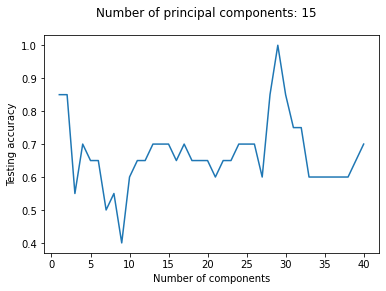

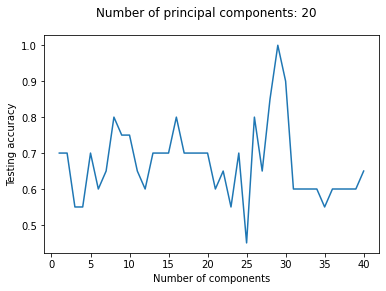

In [48]:
scoresl1 = {}
scores_list1 = []

for i in range(len(classifiers1)):
  nb = nb_range[i]
  knn = classifiers1[i]
  X_train, y_train, X_test, y_test = get_features_pca(10)
  X_testCD = X_test[20:]
  y_testCD = y_test[20:]
  y_testCD = np.asarray(y_testCD)
  y_testCD = y_testCD
  y_true, y_pred = y_testCD, knn.predict(X_testCD)
  scoresl[nb] = accuracy_score(y_true, y_pred)
  scores_list1.append(accuracy_score(y_true, y_pred))


scoresl2 = {}
scores_list2 = []

for i in range(len(classifiers2)):
  nb = nb_range[i]
  knn = classifiers2[i]
  X_train, y_train, X_test, y_test = get_features_pca(15)
  X_testCD = X_test[20:]
  y_testCD = y_test[20:]
  y_testCD = np.asarray(y_testCD)
  y_testCD = y_testCD
  y_true, y_pred = y_testCD, knn.predict(X_testCD)
  scores2[nb] = accuracy_score(y_true, y_pred)
  scores_list2.append(accuracy_score(y_true, y_pred))

scoresl3 = {}
scores_list3 = []

for i in range(len(classifiers3)):
  nb = nb_range[i]
  knn = classifiers3[i]
  X_train, y_train, X_test, y_test = get_features_pca(20)
  X_testCD = X_test[20:]
  y_testCD = y_test[20:]
  y_testCD = np.asarray(y_testCD)
  y_testCD = y_testCD
  y_true, y_pred = y_testCD, knn.predict(X_testCD)
  scores3[nb] = accuracy_score(y_true, y_pred)
  scores_list3.append(accuracy_score(y_true, y_pred))


fig1 = plt.figure()
plt.plot(nb_range, scores_list1)
plt.xlabel('Number of components')
plt.ylabel('Testing accuracy')
fig1.suptitle('Number of principal components: 10')

fig2 = plt.figure()
plt.plot(nb_range, scores_list2)
plt.xlabel('Number of components')
plt.ylabel('Testing accuracy')
fig2.suptitle('Number of principal components: 15')

fig3 = plt.figure()
plt.plot(nb_range, scores_list3)
plt.xlabel('Number of components')
plt.ylabel('Testing accuracy')
fig3.suptitle('Number of principal components: 20')

The classifiers behave poorly on sets C and D, with the mean accuracy lying between 70% and 60%. This means that the created model is best used to classify face sets of the same persons from the test A and B.

**Identification with TL features**

The TL feature representation will be used on the KNN identification.

In [0]:
X_train, y_train, X_test, y_test = get_features_nn()
y_train = np.asarray(y_train)
y_test = np.asarray(y_test)

X_testAB = X_test[:20]
y_testAB = y_test[:20]

X_testCD = X_test[20:]
y_testCD = y_test[20:]


Training on sets A and B:

Text(0.5, 0.98, 'Unweighted identification')

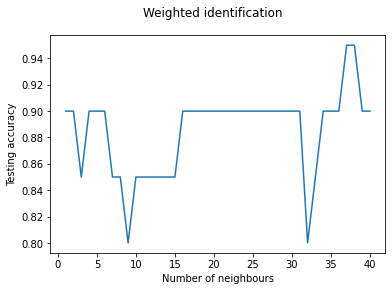

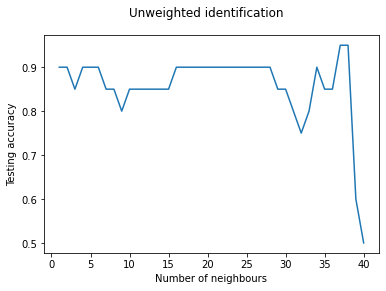

In [50]:
nb_range = range(1,41)
scores = {}
scores_list = []
scores2 = {}
scores_list2 = []
classifiers = []
classifiers2 = []

for nb in nb_range:
  knn2 = KNeighborsClassifier(n_neighbors=nb)
  knn = KNeighborsClassifier(n_neighbors=nb, weights='distance')
  knn.fit(X_train, y_train)
  knn2.fit(X_train, y_train)
  y_pred = knn.predict(X_testAB)
  y_pred2 = knn2.predict(X_testAB)
  scores[nb] = accuracy_score(y_testAB, y_pred)
  scores_list.append(accuracy_score(y_testAB, y_pred))
  classifiers.append(knn)
  scores2[nb] = accuracy_score(y_testAB, y_pred2)
  scores_list2.append(accuracy_score(y_testAB, y_pred2))
  classifiers2.append(knn2)
  


fig1 = plt.figure()
plt.plot(nb_range, scores_list)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig1.suptitle('Weighted identification')

fig2 = plt.figure()
plt.plot(nb_range, scores_list2)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig2.suptitle('Unweighted identification')

For both weighted and unweighted identification the performance of the classifier lies around 90%. Only for the unweighted identification the accuracy drops to 50% when the number of neighbours is 40.

Checking performance on sets C and D:

Text(0.5, 0.98, 'Unweighted identification')

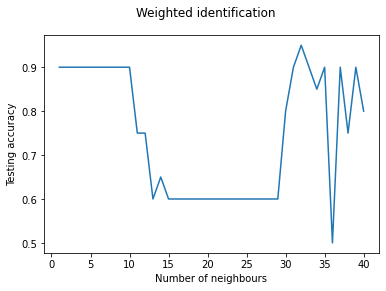

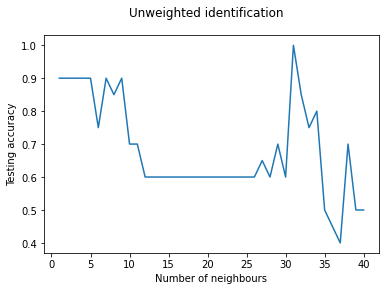

In [51]:
nb_range = range(1,41)
scores = {}
scores_list = []

scores2 = {}
scores_list2 = []

for i in range(len(classifiers)):
  knn = classifiers[i]
  knn2 = classifiers2[i]
  nb = nb_range[i]

  y_pred = knn.predict(X_testCD)
  scores[nb] = accuracy_score(y_testCD, y_pred)
  scores_list.append(accuracy_score(y_testCD, y_pred))

  y_pred2 = knn2.predict(X_testCD)
  scores2[nb] = accuracy_score(y_testCD, y_pred2)
  scores_list2.append(accuracy_score(y_testCD, y_pred2))

fig1 = plt.figure()
plt.plot(nb_range, scores_list)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig1.suptitle('Weighted identification')

fig2 = plt.figure()
plt.plot(nb_range, scores_list2)
plt.xlabel('Number of neighbours')
plt.ylabel('Testing accuracy')
fig2.suptitle('Unweighted identification')

for the number of neighbours lower than 5 both classifiers have a good performance on accuracy with the.

**Conclusion**

When using the K-neighbours-algorithm to classify images it is best to weigh the distance of eacht training point to the query point. If this is not done for a high number of neigbours every training point will have equal influence on classifying the query point, which leads to a drop in accuracy when the number of neighbours gets higher. When looking at the performance of the different feature representations we see that the TL features can best be used when generalizing the data. In comparison to the PCA and HOG feature representations they lie in the middle in the case of the feature space dimension. Which has as a result that they don't lose as much information as PCA features, and aren't as prone to overfitting as HOG features.

## 5.3 Impress your TA’s

**Add the obstructions to the face and test the classifier. We tried to swap the eyes and nose of one person on the face of other person.**

In this section, we will explore a technique based on delaunay triangulation to swap eyes and nose of two persons. The new images will be used to test the classifier. Only eyes and nose will be replaced and cheeks,mouth, ears will be preserved.


In this way, we are created non-linearity for svm. Since k-nn is based on similarity, we are decreasing the similarity between two images and making it hard for the classifier to assign the correct class to an image.

We will do test on svm with PCA features.

We make use of landmarks file to detect nose and eyes. We start our process by downloading the file from the official website. In the next section, we download the shape_predictor file and extract in the home repository.

In [52]:
import dlib
import bz2
from PIL import Image, ImageDraw
import argparse
from scipy.spatial import distance
import urllib.request
import os


eye_template_url = "https://github.com/tzutalin/dlib-android/blob/master/data/shape_predictor_68_face_landmarks.dat"
cmd = "wget  -c --progress=bar http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2"
os.system(cmd)
filepath = "shape_predictor_68_face_landmarks.dat.bz2"
zipfile = bz2.BZ2File(filepath) 
data = zipfile.read() 
newfilepath = filepath[:-4] 
open(newfilepath, 'wb').write(data) 



99693937

This section creates a detector and predictor instance that will be used for the landmarks. The idea is to extract the certain regions of first person in first image and then rescale them so that they can fit on the face regions of other person.

In [0]:
predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
detector = dlib.get_frontal_face_detector()

The first step is to indentify the regions that we want to swap. We have to extract their coordinates and other information aswell.  We do it on the basis of landmarks. The following image shows the points and the predictor instance that we created in previous section will allow us to extract the coordinates of these points.

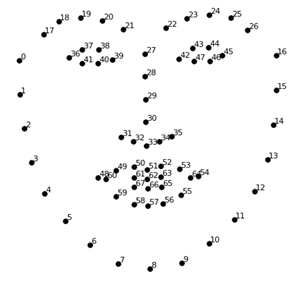

In [54]:
img_url = "https://user-images.githubusercontent.com/35115877/50806751-e3cf2d00-12ef-11e9-9b2e-764fa23e4c9c.png"
res = request.urlopen(img_url)
img = np.asarray(bytearray(res.read()), dtype="uint8")
img = cv2.imdecode(img, cv2.IMREAD_COLOR)
cv2_imshow(img)

We create a deep copy of all the images so that the original images are not modified.

In [0]:
to_mod_test_data = []
to_mod_train_data = copy.deepcopy(train_images_org)
to_mod_test_data = copy.deepcopy(test_images_org)

In the next section, we will run through two different lists. We will take one image from each list and perform different operations. However,since we need a loop to run through all images in the list, it is not possible to add text cell between them. 

In [0]:
def extract_index(nparray):
    index = None
    for num in nparray[0]:
        index = num
        break
    return index


In [0]:
 def get_faces(imaag):
    faces = faceCascade.detectMultiScale(imaag,1.3,2)
    return faces

In [0]:
#list_first is the list that contains all the images of first person.
list_first = []
for image in to_mod_train_data[0]:
  if image is not None:
     list_first.append(copy.deepcopy(image))
#list_second is the list that contains all the images of the second perosn.
list_second = []
for image in to_mod_train_data[1]:
    if image is not None:
     list_second.append(copy.deepcopy(image))

converted_imaged = []

to_print_list = []
#Assume that both lists contain same number of images
is_last_picture = False
points_of_interest = []
points_of_interest.append(0)
for i in range(28):
    points_of_interest.append(i+15)
for i in range(len(list_second)):
    #We need to resize the image as we will use bitwise-and operation at the end.
    if(i == 2):
       is_last_picture = True
    if(i != 2):
       is_last_picture = False
    first_picture = cv2.resize(list_second[i],(600,800))
    second_picture =  cv2.resize(list_first[i],(600,800))
    first_resize_image = cv2.resize(list_second[i],(600,800))
    second_resize_image =  cv2.resize(list_first[i],(600,800))
    if(is_last_picture):
       to_print_list.append(copy.deepcopy(first_resize_image))
       to_print_list.append(copy.deepcopy(second_resize_image))
    img_gray = cv2.cvtColor(first_resize_image, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(second_resize_image, cv2.COLOR_BGR2GRAY)
    mask = np.zeros_like(img_gray)
    img2_new_face = np.zeros(second_resize_image.shape, np.uint8)
    faces = detector(img_gray)

#This is done only for drawing purpose.
    if(is_last_picture):
       new_copy_of_image = copy.deepcopy(first_resize_image)
    if(len(faces) > 0):
       face = faces[0]
       landmarks = predictor(img_gray, face)
       landmarks_points = []
#(Section 1) :Here we find the coordinates of the points which we are interested in.     
       for i in range(len(points_of_interest)):
           x = landmarks.part(points_of_interest[i]).x
           y = landmarks.part(points_of_interest[i]).y
           landmarks_points.append((x, y))
           if (is_last_picture):
               cv2.circle(new_copy_of_image,(x,y),3,(255,0,0),-1)
       if(is_last_picture):
          to_print_list.append(new_copy_of_image)
#Once we have found points, the next thing is to draw a convexhull that will be use to divide the portions into different segments and those 
#segements can be aligned with the segments from other face.

#Section 2 : Here we extract the area with the help of convexhull that we detected above.
       points = np.array(landmarks_points, np.int32)
       convexhull = cv2.convexHull(points)
       cv2.fillConvexPoly(mask, convexhull, 255)
       face_image_1 = cv2.bitwise_and(first_resize_image, first_resize_image, mask=mask)
       #This if is only used to save a picture for later demonstation.
       if(is_last_picture):
          temp_first = copy.deepcopy(first_resize_image)
          cv2.polylines(temp_first, [convexhull], True, (255, 0, 0), 3)
          to_print_list.append(temp_first)
          to_print_list.append(copy.deepcopy(face_image_1))
       

#Now we divide the parts of the specific area in Delaunay triangulation.
       rect = cv2.boundingRect(convexhull)
       subdiv = cv2.Subdiv2D(rect)
       subdiv.insert(landmarks_points)
       triangles = subdiv.getTriangleList()
       triangles = np.array(triangles, dtype=np.int32)
       indexes_triangles = []
       #This is done only for drawing purpose.
       if(is_last_picture):
          new_copy_2 = copy.deepcopy(first_resize_image)
       #we create the coordinates of  the triangle and save them in a list for later use.
       for t in triangles:
          pt1 = (t[0], t[1])
          pt2 = (t[2], t[3])
          pt3 = (t[4], t[5])
          #Only drawing purpose.
          if(is_last_picture):
            cv2.line(new_copy_2,pt1,pt2,(0,0,180),1)
            cv2.line(new_copy_2,pt2,pt3,(0,0,180),1)
            cv2.line(new_copy_2,pt1,pt3,(0,0,180),1)
#Here we find the indexes of the points that we found above.
          index_pt1 = np.where((points == pt1).all(axis=1))
          index_pt1 = extract_index(index_pt1)
          index_pt2 = np.where((points == pt2).all(axis=1))
          index_pt2 = extract_index(index_pt2)
          index_pt3 = np.where((points == pt3).all(axis=1))
          index_pt3 = extract_index(index_pt3)
          if index_pt1 is not None and index_pt2 is not None and index_pt3 is not None:
            triangle = [index_pt1, index_pt2, index_pt3]
            indexes_triangles.append(triangle)
       if(is_last_picture):
          to_print_list.append(new_copy_2)
  
# Section  3 :Now we detect the second face and do the same procedure.
    faces2 = detector(img2_gray)
    for face in faces2:
       landmarks = predictor(img2_gray, face)
       landmarks_points2 = []
       #For only drawing purpose.
       if(is_last_picture):
           some_new_copy = copy.deepcopy(second_resize_image)
       for n in range(len(points_of_interest)):
           x = landmarks.part(points_of_interest[n]).x
           y = landmarks.part(points_of_interest[n]).y
           landmarks_points2.append((x, y))
           if(is_last_picture):
             cv2.circle(some_new_copy,(x,y),3,(0,0,255),-1)
       if(is_last_picture):
          to_print_list.append(some_new_copy)
    points2 = np.array(landmarks_points2, np.int32)
    convexhull2 = cv2.convexHull(points2)
    lines_space_mask = np.zeros_like(img_gray)
    lines_space_new_face = np.zeros_like(second_resize_image)
    if(is_last_picture):
      new_copied_second = copy.deepcopy(second_resize_image)
#Section 4: Triangulation of both faces. We find the same triangles(at same spots) in both images and apply an affine transformation
# So that source triangles fit the target triangle.
    for triangle_index in indexes_triangles:
      # Triangulation of the first face
       tr1_pt1 = landmarks_points[triangle_index[0]]
       tr1_pt2 = landmarks_points[triangle_index[1]]
       tr1_pt3 = landmarks_points[triangle_index[2]]
       triangle1 = np.array([tr1_pt1, tr1_pt2, tr1_pt3], np.int32)
       rect1 = cv2.boundingRect(triangle1)
       (x, y, w, h) = rect1
       cropped_triangle = first_resize_image[y: y + h, x: x + w]
       cropped_tr1_mask = np.zeros((h, w), np.uint8)
       points = np.array([[tr1_pt1[0] - x, tr1_pt1[1] - y],
                       [tr1_pt2[0] - x, tr1_pt2[1] - y],
                       [tr1_pt3[0] - x, tr1_pt3[1] - y]], np.int32)

       cv2.fillConvexPoly(cropped_tr1_mask, points, 255)
       # Lines space
       cv2.line(lines_space_mask, tr1_pt1, tr1_pt2, 255)
       cv2.line(lines_space_mask, tr1_pt2, tr1_pt3, 255)
       cv2.line(lines_space_mask, tr1_pt1, tr1_pt3, 255)
       lines_space = cv2.bitwise_and(first_resize_image, first_resize_image, mask=lines_space_mask)

        # Triangulation of second face
       tr2_pt1 = landmarks_points2[triangle_index[0]]
       tr2_pt2 = landmarks_points2[triangle_index[1]]
       tr2_pt3 = landmarks_points2[triangle_index[2]]
       if(is_last_picture):
          cv2.line(new_copied_second,tr2_pt1,tr2_pt2,(0,0,255),1)
          cv2.line(new_copied_second,tr2_pt2,tr2_pt3,(0,0,255),1)
          cv2.line(new_copied_second,tr2_pt1,tr2_pt3,(0,0,255),1)
       triangle2 = np.array([tr2_pt1, tr2_pt2, tr2_pt3], np.int32)
       rect2 = cv2.boundingRect(triangle2)
       (x, y, w, h) = rect2
       #This mask is used to put the area outside the mask to black.
       cropped_tr2_mask = np.zeros((h, w), np.uint8)
       #Find the coordinats of the triangle with respect to the created mask.
       points2 = np.array([[tr2_pt1[0] - x, tr2_pt1[1] - y],
                        [tr2_pt2[0] - x, tr2_pt2[1] - y],
                        [tr2_pt3[0] - x, tr2_pt3[1] - y]], np.int32)
       #We fill the mask's triangular region with white color.
       cv2.fillConvexPoly(cropped_tr2_mask, points2, 255)         
      # Warp triangles
       points = np.float32(points)
       points2 = np.float32(points2)
       #Trasnform the triangle so that it fits the second one.
       M = cv2.getAffineTransform(points, points2)
       warped_triangle = cv2.warpAffine(cropped_triangle, M, (w, h))
       warped_triangle = cv2.bitwise_and(warped_triangle, warped_triangle, mask=cropped_tr2_mask)

#Section 4: Now we reconstruct the target face from the source face(triangles).
       img2_new_face_rect_area = img2_new_face[y: y + h, x: x + w]
       img2_new_face_rect_area_gray = cv2.cvtColor(img2_new_face_rect_area, cv2.COLOR_BGR2GRAY)
       _, mask_triangles_designed = cv2.threshold(img2_new_face_rect_area_gray, 1, 255, cv2.THRESH_BINARY_INV)
       warped_triangle = cv2.bitwise_and(warped_triangle, warped_triangle, mask=mask_triangles_designed)
       img2_new_face_rect_area = cv2.add(img2_new_face_rect_area, warped_triangle)
       img2_new_face[y: y + h, x: x + w] = img2_new_face_rect_area  


#Section 5: We now put the reconstructed segment on the face of other person.
       img2_face_mask = np.zeros_like(img2_gray)
       img2_head_mask = cv2.fillConvexPoly(img2_face_mask, convexhull2, 255)
       img2_face_mask = cv2.bitwise_not(img2_head_mask)
       img2_head_noface = cv2.bitwise_and(second_resize_image, second_resize_image, mask=img2_face_mask)
       result = cv2.add(img2_head_noface, img2_new_face)
       (x, y, w, h) = cv2.boundingRect(convexhull2)
       center_face2 = (int((x + x + w) / 2), int((y + y + h) / 2))
       seamlessclone_image = cv2.seamlessClone(result, second_resize_image, img2_head_mask, center_face2, cv2.NORMAL_CLONE)
    if (is_last_picture):
         to_print_list.append(new_copied_second)
         to_print_list.append(copy.deepcopy(img2_new_face))
         to_print_list.append(copy.deepcopy(img2_head_noface))
         to_print_list.append(seamlessclone_image)
    converted_imaged.append(copy.deepcopy(seamlessclone_image))



We will explain in this section, the steps that we took in order to obtain the merged picture. However, we will show the images along side the section number(also provided in the code).

This section is based on the face-swapping tutorial from the following blog : https://pysource.com/2019/04/04/face-swapping-opencv-with-python-part-1/


We first take the source image and indetify the region which we want to place on the face of second person. This is done in first section and the result of it are shown below:

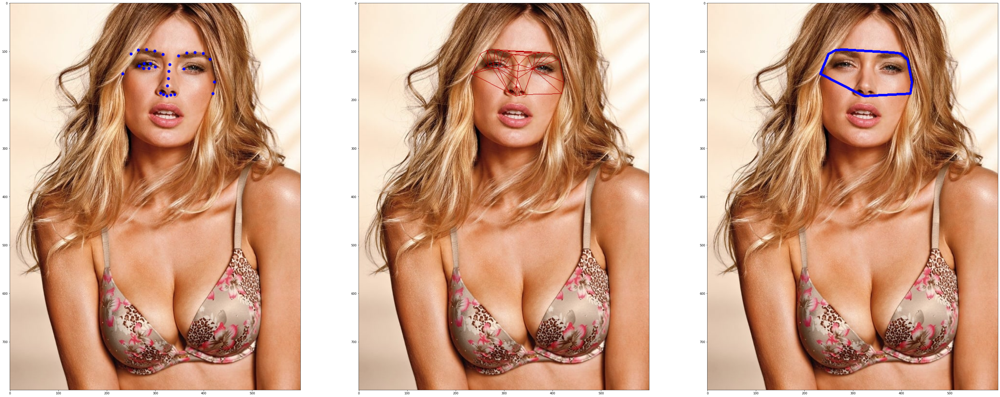

In [59]:
images = []
images.append(cv2.cvtColor(to_print_list[2],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[5],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[3],cv2.COLOR_BGR2RGB))
plt.figure(figsize=(60,60))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

The convex hull shows the area that will be placed on the second image. There are two main issues that we need to solve:

(1): Different components of two images have different size with respect to eachother. For example, eyes of first person are different thatn the second one, in size and in color.


(2): When the skin color of patch that will be placed on the face of second person.


To solve the first issue, we use delaunay triangles and then use affine transformation to convert the triangles, detected in first image, to the triangles detected in second second image.

The next step is to extract the part of the image we are interested in. This is done in section 2 and results are shown below:


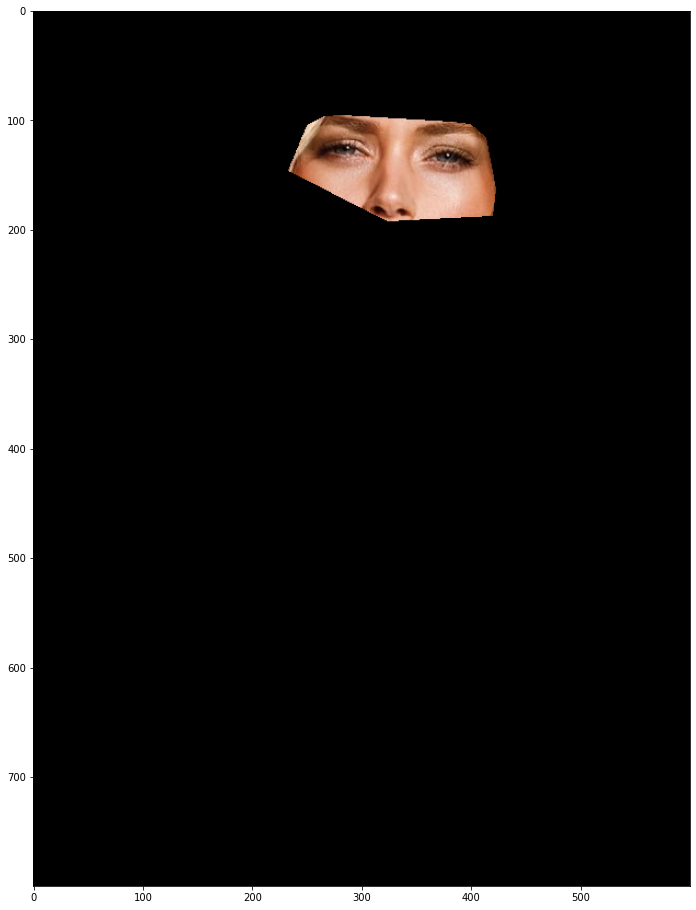

In [60]:
images = []
images.append(cv2.cvtColor(to_print_list[4],cv2.COLOR_BGR2RGB))
plt.figure(figsize=(40,40))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

In section 3, we detect the points of interest and remove that region from the image. The results are shown below in a sequence:

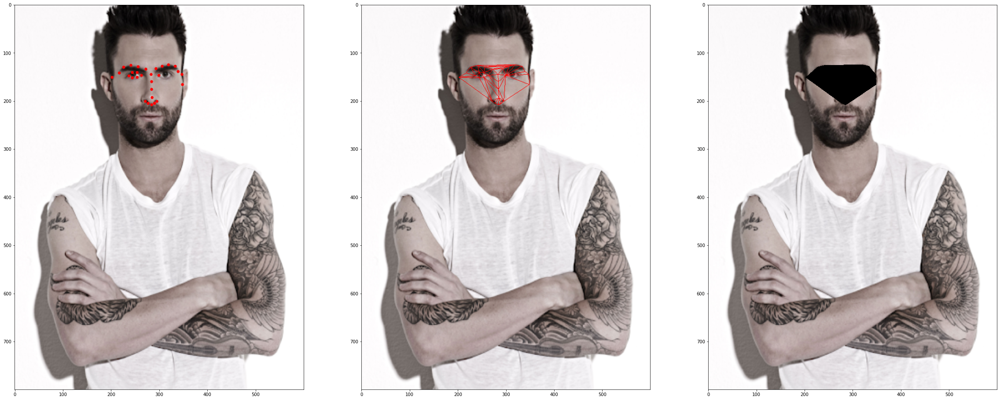

In [61]:
images = []
images.append(cv2.cvtColor(to_print_list[6],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[7],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[9],cv2.COLOR_BGR2RGB))


plt.figure(figsize=(40,40))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

In section 4 , we build the trianlges and apply the affine tranformation so that source and target triangles have equal size. However results of this section are not shown.

In section 5 , we reconstruct the face for the target image from the triangles of source image. Note: Points of source triangles are transformed to target triangles.

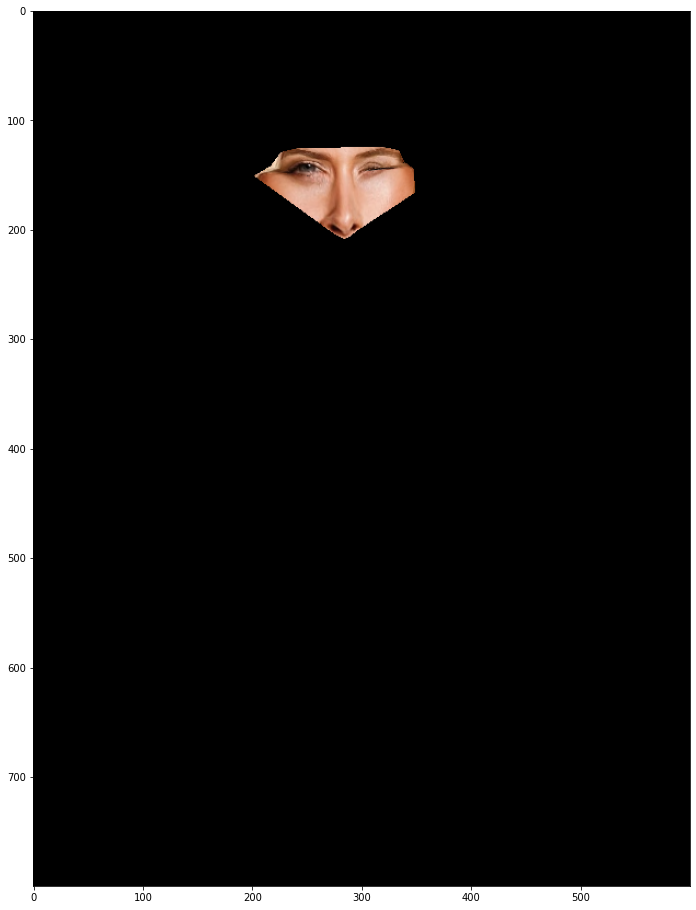

In [62]:
images = []
images.append(cv2.cvtColor(to_print_list[8],cv2.COLOR_BGR2RGB))
plt.figure(figsize=(40,40))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

In section 5, we finally put the reconstructed face on the head of person without face.

To solve the (2) problem, We used the opencv built-in function. It is called seamlessClone. 


The final results of this section are shown below.

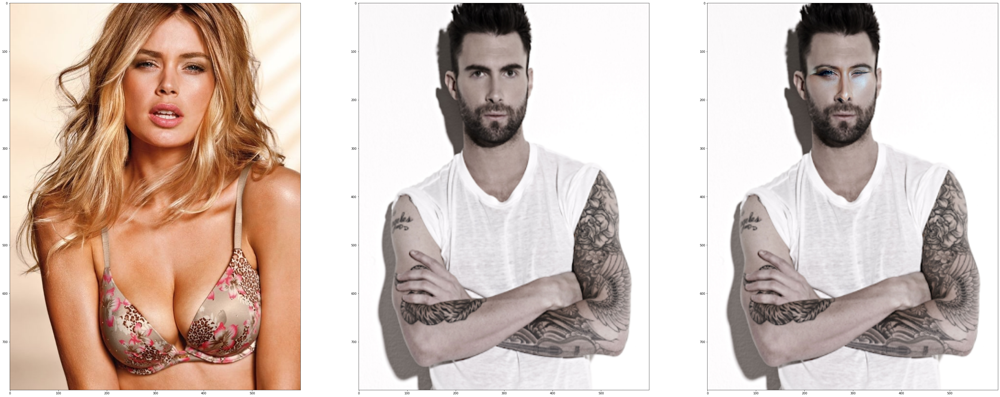

In [63]:
images = []
images.append(cv2.cvtColor(to_print_list[0],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[1],cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(to_print_list[-1],cv2.COLOR_BGR2RGB))
plt.figure(figsize=(60,60))
columns = 3
for i, image in enumerate(images):
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.imshow(image)

In this section , we will run the classifier on these newly built images and see the accuracy. Note: Not all images have perfectly aligned area. This is because in few images hair cover one eye and thos hair are also copied to the next image.


In the next section, we extract the face from the images that we constructed in previous section.

In [0]:
formated_list = []
point_of_interest = []
detector = dlib.get_frontal_face_detector()

for image in converted_imaged:
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    faces = detector(gray)
    if(len(faces) > 0):
       landmarks = predictor(gray,faces[0])
       x = landmarks.part(0).x-50
       y = landmarks.part(18).y-80
       x2 = landmarks.part(8).x
       y2 = landmarks.part(16).y+80
       roi = gray[y:y+y2,x:x+x2]
       roi = cv2.resize(roi,(200,200))
       formated_list.append(copy.deepcopy(roi))
    


Now we construct the HOG features for this newly created image dataset.

In [0]:
image_for_test = []
test_labels_converted  = []
label = 0
for img in formated_list:
    k = np.concatenate(extract_hog_features(img), axis=None)
    image_for_test.append(k)
    test_labels_converted.append(label)


In the following section, we run svm on the HOG features and compare it's result with the section where we used svm with HOG features.

In [66]:
y_true, y_pred = test_labels_converted, classifier_for_end.predict(image_for_test)
print(classification_report(y_true, y_pred))
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
print('True negatives: ', tn)
print('False positives: ', fp)
print('False negatives: ', fn)
print('True positives: ', tp)

              precision    recall  f1-score   support

           0       1.00      0.35      0.52        17
           1       0.00      0.00      0.00         0

    accuracy                           0.35        17
   macro avg       0.50      0.18      0.26        17
weighted avg       1.00      0.35      0.52        17

True negatives:  6
False positives:  11
False negatives:  0
True positives:  0


As we see that the results shown above show strong deviation from the previous section. The reason for this difference lies in the fact that we are trying to create a non-linear decision boundry by merging the parts of the faces. Merging of the face parts requires a non-linear model to perform better and we are using linear svm.

# 6. DISCUSSION

Some reflections and discussion is already stated in the particular sections, so to summarize. We have learned to extract features from images of different faces.
HOG and PCA tend to extract a simpler set of features than a neural network. Therefore, they require less data to be trained, but can handle less complexity (to classify images with this limited dataset, we need them to have a similar pose, lighting conditions, etc.) A neural network can handle more variation, but it is impossible to train it using such a limited set. For the neural network, we can only start from a pretrained network and use transfer learning.

Currently this prototype was trained to distinguish between two different subjects. And even then it is easy to fool when subjects are similar. Images of faces that look very similar (male and short hair or female with long hair) are easily mistaken for one of our subjects. For a security system, we would use a neural network, since this would require a lot of variation, robustness and accuracy. To make this system both more robust and accurate, we would need a lot more data to train the classifiers. At the end, the best approach would be some ensembling of state-of-the-art neural networks pretrained on huge datasets and finetuned for our purpose.